In [1]:
# One by one do all the types of Sentiment Analysis
# 1. Standard
# 2. Emotion
# 3. Intent
# 4. Fine Grain
# 5. Sarcasm
# 6. Apsect Based
# 7. Suggestions

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [3]:
pd.set_option('display.max_columns',None)

In [4]:
pd.set_option('display.max_rows',100)
pd.set_option('display.max_colwidth',200)

## Standard Sentiment Analysis - Positive or Negative

In [5]:
import sqlite3

## Comments

Importing a Flipkart Dataset having 83 tables, one table Items have all the details of other 82 tables containing details ans review of 82 invidual Products.

In [6]:
con = sqlite3.connect("flipkart_products.db")

In [7]:
items = pd.read_sql_query("Select * from items", con)

In [8]:
items.head(20)

,product_id,product_name,price,category,sub_category,specifications,ratings,discount,moreinfo
0,ECMB000001,"Redmi 9A (SeaBlue, 32 GB)","₹7,413",Electronics,Mobile,2 GB RAM | 32 GB ROM16.59 cm (6.53 inch) Full HD+ Display13MP Rear Camera5000 mAh Battery1 Year Manufacturer Warranty,4.3,3.0,/redmi-9a-seablue-32-gb/p/itmeabd39a0cd669?pid=MOBFVD9ZGTYR2WGR&lid=LSTMOBFVD9ZGTYR2WGRTI4SZ6&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_1&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&iid=46c...
1,ECMB000002,"Redmi 9A (Midnight Black, 32 GB)","₹7,421",Electronics,Mobile,2 GB RAM | 32 GB ROM16.59 cm (6.53 inch) Full HD+ Display13MP Rear Camera5000 mAh Battery1 Year Manufacturer Warranty,4.3,3.0,/redmi-9a-midnight-black-32-gb/p/itmeabd39a0cd669?pid=MOBFVDA2RWTCFBHZ&lid=LSTMOBFVDA2RWTCFBHZJV9QUN&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_2&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&...
2,ECMB000003,"Redmi 9A (Nature Green, 32 GB)","₹7,384",Electronics,Mobile,2 GB RAM | 32 GB ROM16.59 cm (6.53 inch) Full HD+ Display13MP Rear Camera5000 mAh Battery1 Year Manufacturer Warranty,4.3,4.0,/redmi-9a-nature-green-32-gb/p/itmeabd39a0cd669?pid=MOBFVDA5QCGNZKH9&lid=LSTMOBFVDA5QCGNZKH9BFDPPY&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_3&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&ii...
3,ECMB000004,"Redmi 9 (Carbon Black, 64 GB)","₹10,745",Electronics,Mobile,4 GB RAM | 64 GB ROM16.59 cm (6.53 inch) HD+ Display13MP + 2MP | 5MP Front Camera5000 mAh BatteryMediaTek Helio G35 Processor1 year manufacturer warranty for device and 6 months manufacturer warra...,4.2,None,/redmi-9-carbon-black-64-gb/p/itm4fb151383983b?pid=MOBFVHMPGATFZXWR&lid=LSTMOBFVHMPGATFZXWRJSNEYT&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_4&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&iid...
4,ECMB000005,"Redmi 9 (Sky Blue, 64 GB)","₹10,489",Electronics,Mobile,4 GB RAM | 64 GB ROM16.59 cm (6.53 inch) HD+ Display13MP + 2MP | 5MP Front Camera5000 mAh BatteryMediaTek Helio G35 Processor1 year manufacturer warranty for device and 6 months manufacturer warra...,4.2,None,/redmi-9-sky-blue-64-gb/p/itm4fb151383983b?pid=MOBFV5FPUS8UHG9H&lid=LSTMOBFV5FPUS8UHG9HDT5GRP&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_5&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&iid=46c...
5,ECMB000006,"Redmi 9A (Midnight Black, 32 GB)","₹8,289",Electronics,Mobile,3 GB RAM | 32 GB ROM | Expandable Upto 512 GB16.59 cm (6.53 inch) HD+ Display13MP Rear Camera | 5MP Front Camera5000 mAh BatteryMediaTek Helio G25 Processor1 year manufacturer warranty for device ...,4.3,None,/redmi-9a-midnight-black-32-gb/p/itmeabd39a0cd669?pid=MOBFVDAYRH3GYNZT&lid=LSTMOBFVDAYRH3GYNZTD8FSTV&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_6&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&...
6,ECMB000007,"Redmi 9A (Nature Green, 32 GB)","₹8,293",Electronics,Mobile,3 GB RAM | 32 GB ROM | Expandable Upto 512 GB16.59 cm (6.53 inch) HD+ Display13MP Rear Camera | 5MP Front Camera5000 mAh BatteryMediaTek Helio G25 Processor1 year manufacturer warranty for device ...,4.3,None,/redmi-9a-nature-green-32-gb/p/itmeabd39a0cd669?pid=MOBFVDAFCKBNXQ7E&lid=LSTMOBFVDAFCKBNXQ7ERLV0D7&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_7&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&ii...
7,ECMB000008,"Redmi 9A (Sea Blue, 32 GB)","₹8,299",Electronics,Mobile,3 GB RAM | 32 GB ROM | Expandable Upto 512 GB16.59 cm (6.53 inch) HD+ Display13MP Rear Camera | 5MP Front Camera5000 mAh BatteryMediaTek Helio G25 Processor1 year manufacturer warranty for device ...,4.3,None,/redmi-9a-sea-blue-32-gb/p/itmeabd39a0cd669?pid=MOBFVDAYEWNQNKHH&lid=LSTMOBFVDAYEWNQNKHHQN5YEQ&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_8&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&iid=46...
8,ECMB000009,"Redmi 8A Dual (Midnight Grey, 32 GB)","₹8,199",Electronics,Mobile,3 GB RAM | 32 GB ROM | Expandable Upto 512 GB15.8 cm (6.22 inch) HD+ Display13MP + 2MP | 8MP Front Camera5000 mAh Lithium Polymer BatteryQualcomm Snapdragon 439 Processor1 Year Manufacturer Warran...,4.2,None,/redmi-8a-d

In [9]:
items.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82 entries, 0 to 81
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   product_id      82 non-null     object
 1   product_name    82 non-null     object
 2   price           82 non-null     object
 3   category        82 non-null     object
 4   sub_category    82 non-null     object
 5   specifications  82 non-null     object
 6   ratings         82 non-null     object
 7   discount        34 non-null     object
 8   moreinfo        82 non-null     object
dtypes: object(9)
memory usage: 5.9+ KB


In [10]:
items['discount'].value_counts()

₹3000    4
3.0      3
₹2000    2
1.0      2
₹1000    2
4.0      2
₹459     1
23.0     1
32.0     1
₹1850    1
15.0     1
6.0      1
18.0     1
₹266     1
₹4333    1
₹284     1
₹1051    1
₹500     1
2.0      1
7.0      1
8.0      1
₹589     1
₹391     1
₹550     1
30.0     1
Name: discount, dtype: int64

In [11]:
items['discount'].describe()

count        34
unique       25
top       ₹3000
freq          4
Name: discount, dtype: object

In [12]:
items['discount']=items['discount'].fillna(0)

In [13]:
items.head(20)

,product_id,product_name,price,category,sub_category,specifications,ratings,discount,moreinfo
0,ECMB000001,"Redmi 9A (SeaBlue, 32 GB)","₹7,413",Electronics,Mobile,2 GB RAM | 32 GB ROM16.59 cm (6.53 inch) Full HD+ Display13MP Rear Camera5000 mAh Battery1 Year Manufacturer Warranty,4.3,3.0,/redmi-9a-seablue-32-gb/p/itmeabd39a0cd669?pid=MOBFVD9ZGTYR2WGR&lid=LSTMOBFVD9ZGTYR2WGRTI4SZ6&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_1&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&iid=46c...
1,ECMB000002,"Redmi 9A (Midnight Black, 32 GB)","₹7,421",Electronics,Mobile,2 GB RAM | 32 GB ROM16.59 cm (6.53 inch) Full HD+ Display13MP Rear Camera5000 mAh Battery1 Year Manufacturer Warranty,4.3,3.0,/redmi-9a-midnight-black-32-gb/p/itmeabd39a0cd669?pid=MOBFVDA2RWTCFBHZ&lid=LSTMOBFVDA2RWTCFBHZJV9QUN&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_2&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&...
2,ECMB000003,"Redmi 9A (Nature Green, 32 GB)","₹7,384",Electronics,Mobile,2 GB RAM | 32 GB ROM16.59 cm (6.53 inch) Full HD+ Display13MP Rear Camera5000 mAh Battery1 Year Manufacturer Warranty,4.3,4.0,/redmi-9a-nature-green-32-gb/p/itmeabd39a0cd669?pid=MOBFVDA5QCGNZKH9&lid=LSTMOBFVDA5QCGNZKH9BFDPPY&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_3&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&ii...
3,ECMB000004,"Redmi 9 (Carbon Black, 64 GB)","₹10,745",Electronics,Mobile,4 GB RAM | 64 GB ROM16.59 cm (6.53 inch) HD+ Display13MP + 2MP | 5MP Front Camera5000 mAh BatteryMediaTek Helio G35 Processor1 year manufacturer warranty for device and 6 months manufacturer warra...,4.2,0,/redmi-9-carbon-black-64-gb/p/itm4fb151383983b?pid=MOBFVHMPGATFZXWR&lid=LSTMOBFVHMPGATFZXWRJSNEYT&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_4&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&iid...
4,ECMB000005,"Redmi 9 (Sky Blue, 64 GB)","₹10,489",Electronics,Mobile,4 GB RAM | 64 GB ROM16.59 cm (6.53 inch) HD+ Display13MP + 2MP | 5MP Front Camera5000 mAh BatteryMediaTek Helio G35 Processor1 year manufacturer warranty for device and 6 months manufacturer warra...,4.2,0,/redmi-9-sky-blue-64-gb/p/itm4fb151383983b?pid=MOBFV5FPUS8UHG9H&lid=LSTMOBFV5FPUS8UHG9HDT5GRP&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_5&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&iid=46c...
5,ECMB000006,"Redmi 9A (Midnight Black, 32 GB)","₹8,289",Electronics,Mobile,3 GB RAM | 32 GB ROM | Expandable Upto 512 GB16.59 cm (6.53 inch) HD+ Display13MP Rear Camera | 5MP Front Camera5000 mAh BatteryMediaTek Helio G25 Processor1 year manufacturer warranty for device ...,4.3,0,/redmi-9a-midnight-black-32-gb/p/itmeabd39a0cd669?pid=MOBFVDAYRH3GYNZT&lid=LSTMOBFVDAYRH3GYNZTD8FSTV&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_6&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&...
6,ECMB000007,"Redmi 9A (Nature Green, 32 GB)","₹8,293",Electronics,Mobile,3 GB RAM | 32 GB ROM | Expandable Upto 512 GB16.59 cm (6.53 inch) HD+ Display13MP Rear Camera | 5MP Front Camera5000 mAh BatteryMediaTek Helio G25 Processor1 year manufacturer warranty for device ...,4.3,0,/redmi-9a-nature-green-32-gb/p/itmeabd39a0cd669?pid=MOBFVDAFCKBNXQ7E&lid=LSTMOBFVDAFCKBNXQ7ERLV0D7&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_7&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&ii...
7,ECMB000008,"Redmi 9A (Sea Blue, 32 GB)","₹8,299",Electronics,Mobile,3 GB RAM | 32 GB ROM | Expandable Upto 512 GB16.59 cm (6.53 inch) HD+ Display13MP Rear Camera | 5MP Front Camera5000 mAh BatteryMediaTek Helio G25 Processor1 year manufacturer warranty for device ...,4.3,0,/redmi-9a-sea-blue-32-gb/p/itmeabd39a0cd669?pid=MOBFVDAYEWNQNKHH&lid=LSTMOBFVDAYEWNQNKHHQN5YEQ&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_8&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&iid=46...
8,ECMB000009,"Redmi 8A Dual (Midnight Grey, 32 GB)","₹8,199",Electronics,Mobile,3 GB RAM | 32 GB ROM | Expandable Upto 512 GB15.8 cm (6.22 inch) HD+ Display13MP + 2MP | 8MP Front Camera5000 mAh Lithium Polymer BatteryQualcomm Snapdragon 439 Processor1 Year Manufacturer Warran...,4.2,0,/redmi-8a-dual-midnight-grey-

##  Handling Missing Values

Replaced the null values in the column 'Discount' with zero and checking it below using info()

In [14]:
items.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82 entries, 0 to 81
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   product_id      82 non-null     object
 1   product_name    82 non-null     object
 2   price           82 non-null     object
 3   category        82 non-null     object
 4   sub_category    82 non-null     object
 5   specifications  82 non-null     object
 6   ratings         82 non-null     object
 7   discount        82 non-null     object
 8   moreinfo        82 non-null     object
dtypes: object(9)
memory usage: 5.9+ KB


## Observation

Now we can see that there are no null values in the items dataset

## Preprocessing

Want to convert ratings column from object to int so that we can find lower, average or higher ratings

In [15]:
items['ratings'].describe()

count      82
unique      5
top       4.3
freq       29
Name: ratings, dtype: object

In [16]:
items['ratings'] = items['ratings'].astype('float')

In [17]:
items.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82 entries, 0 to 81
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   product_id      82 non-null     object 
 1   product_name    82 non-null     object 
 2   price           82 non-null     object 
 3   category        82 non-null     object 
 4   sub_category    82 non-null     object 
 5   specifications  82 non-null     object 
 6   ratings         82 non-null     float64
 7   discount        82 non-null     object 
 8   moreinfo        82 non-null     object 
dtypes: float64(1), object(8)
memory usage: 5.9+ KB


In [18]:
items[items['ratings']<5]

,product_id,product_name,price,category,sub_category,specifications,ratings,discount,moreinfo
0,ECMB000001,"Redmi 9A (SeaBlue, 32 GB)","₹7,413",Electronics,Mobile,2 GB RAM | 32 GB ROM16.59 cm (6.53 inch) Full HD+ Display13MP Rear Camera5000 mAh Battery1 Year Manufacturer Warranty,4.3,3.0,/redmi-9a-seablue-32-gb/p/itmeabd39a0cd669?pid=MOBFVD9ZGTYR2WGR&lid=LSTMOBFVD9ZGTYR2WGRTI4SZ6&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_1&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&iid=46c...
1,ECMB000002,"Redmi 9A (Midnight Black, 32 GB)","₹7,421",Electronics,Mobile,2 GB RAM | 32 GB ROM16.59 cm (6.53 inch) Full HD+ Display13MP Rear Camera5000 mAh Battery1 Year Manufacturer Warranty,4.3,3.0,/redmi-9a-midnight-black-32-gb/p/itmeabd39a0cd669?pid=MOBFVDA2RWTCFBHZ&lid=LSTMOBFVDA2RWTCFBHZJV9QUN&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_2&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&...
2,ECMB000003,"Redmi 9A (Nature Green, 32 GB)","₹7,384",Electronics,Mobile,2 GB RAM | 32 GB ROM16.59 cm (6.53 inch) Full HD+ Display13MP Rear Camera5000 mAh Battery1 Year Manufacturer Warranty,4.3,4.0,/redmi-9a-nature-green-32-gb/p/itmeabd39a0cd669?pid=MOBFVDA5QCGNZKH9&lid=LSTMOBFVDA5QCGNZKH9BFDPPY&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_3&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&ii...
3,ECMB000004,"Redmi 9 (Carbon Black, 64 GB)","₹10,745",Electronics,Mobile,4 GB RAM | 64 GB ROM16.59 cm (6.53 inch) HD+ Display13MP + 2MP | 5MP Front Camera5000 mAh BatteryMediaTek Helio G35 Processor1 year manufacturer warranty for device and 6 months manufacturer warra...,4.2,0,/redmi-9-carbon-black-64-gb/p/itm4fb151383983b?pid=MOBFVHMPGATFZXWR&lid=LSTMOBFVHMPGATFZXWRJSNEYT&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_4&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&iid...
4,ECMB000005,"Redmi 9 (Sky Blue, 64 GB)","₹10,489",Electronics,Mobile,4 GB RAM | 64 GB ROM16.59 cm (6.53 inch) HD+ Display13MP + 2MP | 5MP Front Camera5000 mAh BatteryMediaTek Helio G35 Processor1 year manufacturer warranty for device and 6 months manufacturer warra...,4.2,0,/redmi-9-sky-blue-64-gb/p/itm4fb151383983b?pid=MOBFV5FPUS8UHG9H&lid=LSTMOBFV5FPUS8UHG9HDT5GRP&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_5&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&iid=46c...
5,ECMB000006,"Redmi 9A (Midnight Black, 32 GB)","₹8,289",Electronics,Mobile,3 GB RAM | 32 GB ROM | Expandable Upto 512 GB16.59 cm (6.53 inch) HD+ Display13MP Rear Camera | 5MP Front Camera5000 mAh BatteryMediaTek Helio G25 Processor1 year manufacturer warranty for device ...,4.3,0,/redmi-9a-midnight-black-32-gb/p/itmeabd39a0cd669?pid=MOBFVDAYRH3GYNZT&lid=LSTMOBFVDAYRH3GYNZTD8FSTV&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_6&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&...
6,ECMB000007,"Redmi 9A (Nature Green, 32 GB)","₹8,293",Electronics,Mobile,3 GB RAM | 32 GB ROM | Expandable Upto 512 GB16.59 cm (6.53 inch) HD+ Display13MP Rear Camera | 5MP Front Camera5000 mAh BatteryMediaTek Helio G25 Processor1 year manufacturer warranty for device ...,4.3,0,/redmi-9a-nature-green-32-gb/p/itmeabd39a0cd669?pid=MOBFVDAFCKBNXQ7E&lid=LSTMOBFVDAFCKBNXQ7ERLV0D7&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_7&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&ii...
7,ECMB000008,"Redmi 9A (Sea Blue, 32 GB)","₹8,299",Electronics,Mobile,3 GB RAM | 32 GB ROM | Expandable Upto 512 GB16.59 cm (6.53 inch) HD+ Display13MP Rear Camera | 5MP Front Camera5000 mAh BatteryMediaTek Helio G25 Processor1 year manufacturer warranty for device ...,4.3,0,/redmi-9a-sea-blue-32-gb/p/itmeabd39a0cd669?pid=MOBFVDAYEWNQNKHH&lid=LSTMOBFVDAYEWNQNKHHQN5YEQ&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_8&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&iid=46...
8,ECMB000009,"Redmi 8A Dual (Midnight Grey, 32 GB)","₹8,199",Electronics,Mobile,3 GB RAM | 32 GB ROM | Expandable Upto 512 GB15.8 cm (6.22 inch) HD+ Display13MP + 2MP | 8MP Front Camera5000 mAh Lithium Polymer BatteryQualcomm Snapdragon 439 Processor1 Year Manufacturer Warran...,4.2,0,/redmi-8a-dual-midnight-grey-

In [19]:
plt.rcParams['figure.figsize'] = [10,6]



<AxesSubplot:xlabel='ratings', ylabel='Count'>

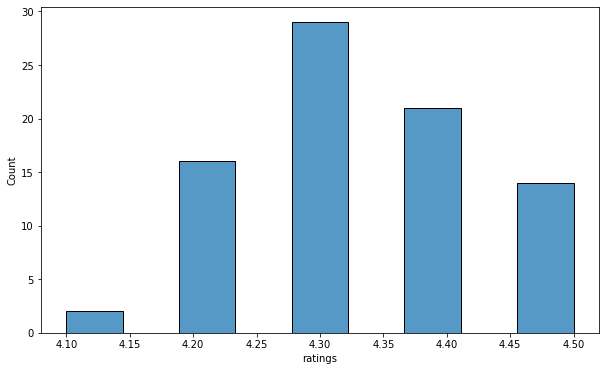

In [20]:
sns.histplot(items['ratings'])

In [21]:
items[items['ratings']<4.2]

,product_id,product_name,price,category,sub_category,specifications,ratings,discount,moreinfo
55,ECMB000056,"Mi 10T (Cosmic Black, 128 GB)","₹34,999",Electronics,Mobile,8 GB RAM | 128 GB ROM16.94 cm (6.67 inch) Full HD+ Display64MP + 13MP + 5MP | 20MP Front Camera5000 mAh Li-ion Polymer BatteryQualcomm Snapdragon 865 Processor144Hz Intelligent AdaptiveSync Displa...,4.1,18.0,/mi-10t-cosmic-black-128-gb/p/itmcd714276806ef?pid=MOBFWAFZNCMVPHMZ&lid=LSTMOBFWAFZNCMVPHMZ01JM2Z&marketplace=FLIPKART&store=tyy%2F4io&srno=b_6_121&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&i...
71,ECMB000072,"Mi A2 (Black, 128 GB)","₹20,500",Electronics,Mobile,6 GB RAM | 128 GB ROM15.21 cm (5.99 inch) Full HD+ Display20MP + 12MP | 20MP Front Camera3010 mAh BatteryQualcomm Snapdragon 660 AIE ProcessorBrand Warranty of 1 Year Available for Mobile and 6 Mo...,4.1,0,/mi-a2-black-128-gb/p/itmfghsghuarsxzf?pid=MOBFDAADYTYHQQ9R&lid=LSTMOBFDAADYTYHQQ9RTNC8TD&marketplace=FLIPKART&store=tyy%2F4io&srno=b_9_194&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&iid=868cc...


## Reading Data

Fetching a table from the database having ratings 4.1 and table name ECMB000056

In [22]:
df1 = pd.read_sql_query('select * from ECMB000056',con)

In [23]:
df1.head(20)

,product_id,review_id,title,review,likes,dislikes,ratings,reviewer
0,ECMB000056,ECMB0000560000001,Very Good,I received this two days ago. I'm satisfied with the performance of the mobile but extremely disappointed with the behavior of delivery person. Completely unprofessional and annoying. I got this p...,293,74,4,Shuvendu Mukherjee
1,ECMB000056,ECMB0000560000002,Perfect product!,Awesome!!I have switched from LG G6 to this device. This my first Mi device so I had some kind of uneasiness while purchasing it but offer was too good to resist. First impression: It is very prem...,368,111,5,Ashish Patil
2,ECMB000056,ECMB0000560000003,Just wow!,Superb performance and looks premium. The only thing i dont like about this phone is its display. Those who want for gaming its the best in this price range you will get 90fps by default..Camera i...,124,34,5,Ankit Gupta
3,ECMB000056,ECMB0000560000004,Mind-blowing purchase,Wat a mobile .I bought it with 8gb ram Camera is really good . . . Battery is also good and usefull for heavy users . . Within in 1 hour ll get full charge . . Very fast with 144 refresh rate,20,12,5,Manjunatha Kn
4,ECMB000056,ECMB0000560000005,Just wow!,Awesome performance great experience smooth game play. Good battery life and value for money.Display is not the best.,20,2,5,Bastian v Antony Antony
5,ECMB000056,ECMB0000560000006,Classy product,"Mi10t has all the features which I was looking for. Amazing Camera, IR blaster, NFC, good battery backup, 5G support , refresh rate upto 144Hz and awesome performance.Also there's no ads in this p...",18,2,5,Gurjeet Singh
6,ECMB000056,ECMB0000560000007,Super!,"Its a great performing phone at the given price. The display is a little disappointing but its not very bad. The camera takes crisp shots, the portrait mode is great. The selfies come out really n...",18,4,5,Shreya
7,ECMB000056,ECMB0000560000008,Honest experience.,"I've been using this phone for around 20 days now and I think that's quite enough to give my feedback. So Mi 10t is so great when it comes to hardware, say SD865,144HZ (i know its lcd, but I'll ta...",6,0,5,Flipkart Customer
8,ECMB000056,ECMB0000560000009,Good choice,"Phone is very good. Cons:Front camera is not good even u use gcam.Latest Android 11 update has so many bugs, like app crashing.. and etc. Pros:Good display.144hz is very fast and very smooth. Perf...",9,1,4,Shrinath Ts
9,ECMB000056,ECMB0000560000010,Awesome,Initial impressions are great!Edit (after a week) : Performance is smooooth. MiUi is really well optimized for this device. Gaming is superb! Display is a top quality LCD panel so no problem with ...,4,0,5,Aashish Dhami


## Exploration

Exploring the table

In [24]:
df1['ratings'].value_counts()

5    165
4     51
3     27
Name: ratings, dtype: int64

In [25]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 289 entries, 0 to 288
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   product_id  289 non-null    object
 1   review_id   289 non-null    object
 2   title       289 non-null    object
 3   review      289 non-null    object
 4   likes       289 non-null    object
 5   dislikes    289 non-null    object
 6   ratings     243 non-null    object
 7   reviewer    289 non-null    object
dtypes: object(8)
memory usage: 18.2+ KB


## Observation

we can see above there are some null values present int the ratings column of this table


In [26]:
df1['ratings'].describe()

count     243
unique      3
top         5
freq      165
Name: ratings, dtype: object

In [27]:
df1[df1['ratings'].isna()]

,product_id,review_id,title,review,likes,dislikes,ratings,reviewer
33,ECMB000056,ECMB0000560000034,Not recommended at all,"Please do verify the IMEI number. I received the product where the IMEI number is not valid. If you're IMEI number is not valid the product might be duplicate one, even you will not get better exc...",19,7,None,Vinod
43,ECMB000056,ECMB0000560000044,Heavy vibrating issue at the back of the mobile...,Don't buy this product... It has vibration issues while hearing to music or watching video holding in hands...,5,1,None,Rajkumar T
54,ECMB000056,ECMB0000560000055,Slightly disappointed,Suddenly my mobile has been switch off I do no what to do....so please be careful while puchase this mobile ...really I'm not satisfied this mobile,1,0,None,Gouse Basha
60,ECMB000056,ECMB0000560000061,Not recommended at all,"Mobile not good.touch not working properly, camera quality not good,",21,41,None,Thulasi Nagasuman
61,ECMB000056,ECMB0000560000062,Moderate,"I just buy it's may b four to five days and my MI 10T is fully hanged noting is working when I touch the display..,",2,2,None,amit bahadur
63,ECMB000056,ECMB0000560000064,Worst experience ever!,"Worst service,worst product.....don't shopping flipkart",4,4,None,Nithis Kumar
72,ECMB000056,ECMB0000560000073,Worst experience ever!,Last day I got an Update For Mi 10 T. And is packed with bugs when will they fix it? (MIUI 12.1.2.0),1,0,None,SACHIN SABU
74,ECMB000056,ECMB0000560000075,Absolute rubbish!,Mobile over heating on playing games,0,0,None,Baskaran R
76,ECMB000056,ECMB0000560000077,Don't waste your money,Too hight cost,0,0,None,Shami Loveshore
77,ECMB000056,ECMB0000560000078,Terrible product,defective product,0,0,None,Flipkart Customer


In [28]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 289 entries, 0 to 288
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   product_id  289 non-null    object
 1   review_id   289 non-null    object
 2   title       289 non-null    object
 3   review      289 non-null    object
 4   likes       289 non-null    object
 5   dislikes    289 non-null    object
 6   ratings     243 non-null    object
 7   reviewer    289 non-null    object
dtypes: object(8)
memory usage: 18.2+ KB


In [29]:
df1[df1['ratings'].isna()].count()

product_id    46
review_id     46
title         46
review        46
likes         46
dislikes      46
ratings        0
reviewer      46
dtype: int64

## Observation

We can see above that ratings which Null value has reviews among which most of them are negative, so we may have to assign a ratings to each of the 46 reviews which has null value in the ratings column

In [30]:
df1['ratings'].fillna('1').isna().sum()

0

In [31]:
df1['ratings'] = df1['ratings'].fillna(1)

In [32]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 289 entries, 0 to 288
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   product_id  289 non-null    object
 1   review_id   289 non-null    object
 2   title       289 non-null    object
 3   review      289 non-null    object
 4   likes       289 non-null    object
 5   dislikes    289 non-null    object
 6   ratings     289 non-null    object
 7   reviewer    289 non-null    object
dtypes: object(8)
memory usage: 18.2+ KB


In [33]:
df1.head(20)

,product_id,review_id,title,review,likes,dislikes,ratings,reviewer
0,ECMB000056,ECMB0000560000001,Very Good,I received this two days ago. I'm satisfied with the performance of the mobile but extremely disappointed with the behavior of delivery person. Completely unprofessional and annoying. I got this p...,293,74,4,Shuvendu Mukherjee
1,ECMB000056,ECMB0000560000002,Perfect product!,Awesome!!I have switched from LG G6 to this device. This my first Mi device so I had some kind of uneasiness while purchasing it but offer was too good to resist. First impression: It is very prem...,368,111,5,Ashish Patil
2,ECMB000056,ECMB0000560000003,Just wow!,Superb performance and looks premium. The only thing i dont like about this phone is its display. Those who want for gaming its the best in this price range you will get 90fps by default..Camera i...,124,34,5,Ankit Gupta
3,ECMB000056,ECMB0000560000004,Mind-blowing purchase,Wat a mobile .I bought it with 8gb ram Camera is really good . . . Battery is also good and usefull for heavy users . . Within in 1 hour ll get full charge . . Very fast with 144 refresh rate,20,12,5,Manjunatha Kn
4,ECMB000056,ECMB0000560000005,Just wow!,Awesome performance great experience smooth game play. Good battery life and value for money.Display is not the best.,20,2,5,Bastian v Antony Antony
5,ECMB000056,ECMB0000560000006,Classy product,"Mi10t has all the features which I was looking for. Amazing Camera, IR blaster, NFC, good battery backup, 5G support , refresh rate upto 144Hz and awesome performance.Also there's no ads in this p...",18,2,5,Gurjeet Singh
6,ECMB000056,ECMB0000560000007,Super!,"Its a great performing phone at the given price. The display is a little disappointing but its not very bad. The camera takes crisp shots, the portrait mode is great. The selfies come out really n...",18,4,5,Shreya
7,ECMB000056,ECMB0000560000008,Honest experience.,"I've been using this phone for around 20 days now and I think that's quite enough to give my feedback. So Mi 10t is so great when it comes to hardware, say SD865,144HZ (i know its lcd, but I'll ta...",6,0,5,Flipkart Customer
8,ECMB000056,ECMB0000560000009,Good choice,"Phone is very good. Cons:Front camera is not good even u use gcam.Latest Android 11 update has so many bugs, like app crashing.. and etc. Pros:Good display.144hz is very fast and very smooth. Perf...",9,1,4,Shrinath Ts
9,ECMB000056,ECMB0000560000010,Awesome,Initial impressions are great!Edit (after a week) : Performance is smooooth. MiUi is really well optimized for this device. Gaming is superb! Display is a top quality LCD panel so no problem with ...,4,0,5,Aashish Dhami


<AxesSubplot:xlabel='ratings', ylabel='Count'>

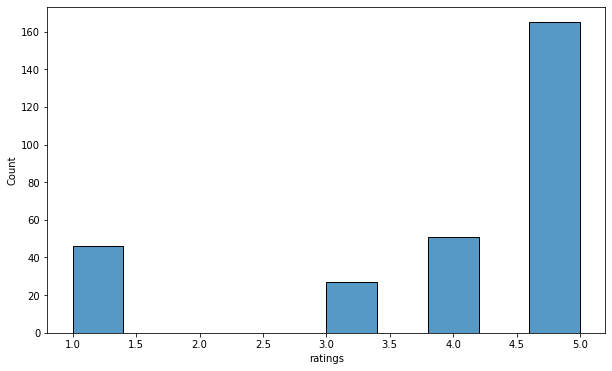

In [34]:
sns.histplot(df1['ratings'].astype(int))

In [35]:
df1.head(30)

,product_id,review_id,title,review,likes,dislikes,ratings,reviewer
0,ECMB000056,ECMB0000560000001,Very Good,I received this two days ago. I'm satisfied with the performance of the mobile but extremely disappointed with the behavior of delivery person. Completely unprofessional and annoying. I got this p...,293,74,4,Shuvendu Mukherjee
1,ECMB000056,ECMB0000560000002,Perfect product!,Awesome!!I have switched from LG G6 to this device. This my first Mi device so I had some kind of uneasiness while purchasing it but offer was too good to resist. First impression: It is very prem...,368,111,5,Ashish Patil
2,ECMB000056,ECMB0000560000003,Just wow!,Superb performance and looks premium. The only thing i dont like about this phone is its display. Those who want for gaming its the best in this price range you will get 90fps by default..Camera i...,124,34,5,Ankit Gupta
3,ECMB000056,ECMB0000560000004,Mind-blowing purchase,Wat a mobile .I bought it with 8gb ram Camera is really good . . . Battery is also good and usefull for heavy users . . Within in 1 hour ll get full charge . . Very fast with 144 refresh rate,20,12,5,Manjunatha Kn
4,ECMB000056,ECMB0000560000005,Just wow!,Awesome performance great experience smooth game play. Good battery life and value for money.Display is not the best.,20,2,5,Bastian v Antony Antony
5,ECMB000056,ECMB0000560000006,Classy product,"Mi10t has all the features which I was looking for. Amazing Camera, IR blaster, NFC, good battery backup, 5G support , refresh rate upto 144Hz and awesome performance.Also there's no ads in this p...",18,2,5,Gurjeet Singh
6,ECMB000056,ECMB0000560000007,Super!,"Its a great performing phone at the given price. The display is a little disappointing but its not very bad. The camera takes crisp shots, the portrait mode is great. The selfies come out really n...",18,4,5,Shreya
7,ECMB000056,ECMB0000560000008,Honest experience.,"I've been using this phone for around 20 days now and I think that's quite enough to give my feedback. So Mi 10t is so great when it comes to hardware, say SD865,144HZ (i know its lcd, but I'll ta...",6,0,5,Flipkart Customer
8,ECMB000056,ECMB0000560000009,Good choice,"Phone is very good. Cons:Front camera is not good even u use gcam.Latest Android 11 update has so many bugs, like app crashing.. and etc. Pros:Good display.144hz is very fast and very smooth. Perf...",9,1,4,Shrinath Ts
9,ECMB000056,ECMB0000560000010,Awesome,Initial impressions are great!Edit (after a week) : Performance is smooooth. MiUi is really well optimized for this device. Gaming is superb! Display is a top quality LCD panel so no problem with ...,4,0,5,Aashish Dhami


## Combining all the Tables

There is a cool way to combine all the tables and we will have lots of data after combining all the data, So Let's just look at the table after combining them.

In [36]:
items.head()

,product_id,product_name,price,category,sub_category,specifications,ratings,discount,moreinfo
0,ECMB000001,"Redmi 9A (SeaBlue, 32 GB)","₹7,413",Electronics,Mobile,2 GB RAM | 32 GB ROM16.59 cm (6.53 inch) Full HD+ Display13MP Rear Camera5000 mAh Battery1 Year Manufacturer Warranty,4.3,3.0,/redmi-9a-seablue-32-gb/p/itmeabd39a0cd669?pid=MOBFVD9ZGTYR2WGR&lid=LSTMOBFVD9ZGTYR2WGRTI4SZ6&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_1&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&iid=46c...
1,ECMB000002,"Redmi 9A (Midnight Black, 32 GB)","₹7,421",Electronics,Mobile,2 GB RAM | 32 GB ROM16.59 cm (6.53 inch) Full HD+ Display13MP Rear Camera5000 mAh Battery1 Year Manufacturer Warranty,4.3,3.0,/redmi-9a-midnight-black-32-gb/p/itmeabd39a0cd669?pid=MOBFVDA2RWTCFBHZ&lid=LSTMOBFVDA2RWTCFBHZJV9QUN&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_2&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&...
2,ECMB000003,"Redmi 9A (Nature Green, 32 GB)","₹7,384",Electronics,Mobile,2 GB RAM | 32 GB ROM16.59 cm (6.53 inch) Full HD+ Display13MP Rear Camera5000 mAh Battery1 Year Manufacturer Warranty,4.3,4.0,/redmi-9a-nature-green-32-gb/p/itmeabd39a0cd669?pid=MOBFVDA5QCGNZKH9&lid=LSTMOBFVDA5QCGNZKH9BFDPPY&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_3&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&ii...
3,ECMB000004,"Redmi 9 (Carbon Black, 64 GB)","₹10,745",Electronics,Mobile,4 GB RAM | 64 GB ROM16.59 cm (6.53 inch) HD+ Display13MP + 2MP | 5MP Front Camera5000 mAh BatteryMediaTek Helio G35 Processor1 year manufacturer warranty for device and 6 months manufacturer warra...,4.2,0,/redmi-9-carbon-black-64-gb/p/itm4fb151383983b?pid=MOBFVHMPGATFZXWR&lid=LSTMOBFVHMPGATFZXWRJSNEYT&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_4&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&iid...
4,ECMB000005,"Redmi 9 (Sky Blue, 64 GB)","₹10,489",Electronics,Mobile,4 GB RAM | 64 GB ROM16.59 cm (6.53 inch) HD+ Display13MP + 2MP | 5MP Front Camera5000 mAh BatteryMediaTek Helio G35 Processor1 year manufacturer warranty for device and 6 months manufacturer warra...,4.2,0,/redmi-9-sky-blue-64-gb/p/itm4fb151383983b?pid=MOBFV5FPUS8UHG9H&lid=LSTMOBFV5FPUS8UHG9HDT5GRP&marketplace=FLIPKART&store=tyy%2F4io&srno=b_1_5&otracker=nmenu_sub_Electronics_0_Mi&fm=organic&iid=46c...


In [37]:
df = pd.read_sql_query('select * from ECMB000001',con)

In [38]:
df.head()

,product_id,review_id,title,review,likes,dislikes,ratings,reviewer
0,ECMB000001,ECMB0000010000001,Excellent,Wow superb I love it❤️👍 battery backup so nice 👍👍,740,160,5,Abhishek Saini
1,ECMB000001,ECMB0000010000002,Worth the money,Mobile So Good In Range Redmi 9a Has Miui 12 Latest Version Nice Phone Display So Good And Battery Was So Very Good,355,104,4,Dinesh Kumar Sahni
2,ECMB000001,ECMB0000010000003,Just wow!,Wonderful device and smart phone best camera best bettery and very nice looking nd budget device,125,47,5,Flipkart Customer
3,ECMB000001,ECMB0000010000004,Simply awesome,Very good mobile. Value for money. Battery back up is very good also other functions are smooth. Camera picture good quality. Automatic call recording are available.. Nice mobile..,0,0,5,Amit Sen
4,ECMB000001,ECMB0000010000005,Highly recommended,Really great.... value for money...,90,15,5,Sudeshna pakira


## Cool Tricks

Using Format to merge all the datasets having a same naming convention with just numbers changing

In [39]:
for i in range(2,len(items)+1):
    df_temp = pd.read_sql_query('select * from ECMB{:06d}'.format(i),con)
    df = pd.concat([df,df_temp])
con.close()

In [40]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53493 entries, 0 to 289
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   product_id  53493 non-null  object
 1   review_id   53493 non-null  object
 2   title       53493 non-null  object
 3   review      53493 non-null  object
 4   likes       53493 non-null  object
 5   dislikes    53493 non-null  object
 6   ratings     48488 non-null  object
 7   reviewer    53493 non-null  object
dtypes: object(8)
memory usage: 3.7+ MB


In [41]:
df['ratings'].value_counts()

5    33721
4    11030
3     3737
Name: ratings, dtype: int64

In [42]:
df['title'].nunique()

783

In [43]:
df[df['likes'].astype(int) < df['dislikes'].astype(int)].head(30)

,product_id,review_id,title,review,likes,dislikes,ratings,reviewer
44,ECMB000001,ECMB0000010000045,Pretty good,Very good,6,7,4,Flipkart Customer
92,ECMB000001,ECMB0000010000093,Excellent,best phone value for money,4,5,5,Flipkart Customer
96,ECMB000001,ECMB0000010000097,Don't waste your money,Delivery person was very bad,3,8,None,Flipkart Customer
398,ECMB000001,ECMB0000010000399,Horrible,Not good,0,1,None,AKASH S
469,ECMB000001,ECMB0000010000470,Terrific,What a good perfomance. Excellent glarity and good display,0,1,5,v s kanagaraj
523,ECMB000001,ECMB0000010000524,Bad quality,It is ok,0,1,None,Flipkart Customer
44,ECMB000002,ECMB0000020000045,Pretty good,Very good,6,7,4,Flipkart Customer
92,ECMB000002,ECMB0000020000093,Excellent,best phone value for money,4,5,5,Flipkart Customer
96,ECMB000002,ECMB0000020000097,Don't waste your money,Delivery person was very bad,3,8,None,Flipkart Customer
400,ECMB000002,ECMB0000020000401,Horrible,Not good,0,1,None,AKASH S


## Observation

1. We can see above that comparing no. of likes and dislikes dosen't gives the accurate reading means I thought that if no. of dislikes is greater than no. of likes then it should have a bad review but we know that a bad prouct for one person can be good for an another person


2. I have also observed that all the rows which have none value in their ratings column are a negative review maybe because people don't give even a one star if they don't like the product, we can use this asssumption Null values in the ratings columns.

In [44]:
df[df['ratings'].isna()].head(50)

,product_id,review_id,title,review,likes,dislikes,ratings,reviewer
14,ECMB000001,ECMB0000010000015,Could be way better,Camera quality is very very low.Sound quality: incoming and out going speakers are also at very low frequency.Even u cannot watch a movie using this speakers and phone.Very low frequency sound.,3,0,None,svrkrao
27,ECMB000001,ECMB0000010000028,Don't waste your money,Hanging problem,8,3,None,Nooriya Banu
40,ECMB000001,ECMB0000010000041,Horrible,"Worest mobile....so meny problems at redmi 9a charger and mobile 📲 heating issue, low camera 📸📷 quality..... please don't buy this product....",10,8,None,Ravi Teja
43,ECMB000001,ECMB0000010000044,Unsatisfactory,Very bad product,3,2,None,Flipkart Customer
46,ECMB000001,ECMB0000010000047,Horrible,Speaker issue,2,0,None,Flipkart Customer
48,ECMB000001,ECMB0000010000049,Utterly Disappointed,It hangs,2,0,None,Vrushabh Patil
86,ECMB000001,ECMB0000010000087,Expected a better product,Very bad or faulty camera.,0,0,None,Sonu singh
88,ECMB000001,ECMB0000010000089,Hated it!,very bad,1,0,None,Flipkart Customer
96,ECMB000001,ECMB0000010000097,Don't waste your money,Delivery person was very bad,3,8,None,Flipkart Customer
98,ECMB000001,ECMB0000010000099,Worst experience ever!,Very slow,1,0,None,Harish G L


In [45]:
df[df['ratings'].isna()].tail(50)

,product_id,review_id,title,review,likes,dislikes,ratings,reviewer
153,ECMB000082,ECMB0000820000154,Hated it!,"I am giving 1 star because this is the 1st time i have experienced this issue.not even 1 week into use, the phone display is completely blank. I was on a call and once the call was cut the display...",1,0,None,Jagadish Gaonkar
156,ECMB000082,ECMB0000820000157,Don't waste your money,Very worst condition,0,0,None,Flipkart Customer
157,ECMB000082,ECMB0000820000158,Unsatisfactory,Not at all good comparing to other mi mobile.,0,0,None,Chandra Sekhar K V S
158,ECMB000082,ECMB0000820000159,Useless product,Mobile was not so goodMobile internet problem,0,0,None,Yakshith Nangaru
161,ECMB000082,ECMB0000820000162,Utterly Disappointed,Very bed set,0,0,None,AVNISH KUMAR
162,ECMB000082,ECMB0000820000163,Terrible product,This mobile is very dad,0,0,None,Alka Singh
164,ECMB000082,ECMB0000820000165,Utterly Disappointed,This is a most bad product it is not so big in screen and a huge waste of money,0,0,None,PINTU MUKHERJEE
166,ECMB000082,ECMB0000820000167,Worst experience ever!,Mi a3 sim problmma agide,0,0,None,Arun Navalli
167,ECMB000082,ECMB0000820000168,Very poor,Ek no ka gatia. Waste of money. Bad quality. No rang . No clear voice. Net problem,0,0,None,Flipkart Customer
168,ECMB000082,ECMB0000820000169,Don't waste your money,"I dropped once & now Dispay, Motherboard, & speaker, Bluetooth & Internal software also not working. MI Authorized Technical person told wvwn we are surprised.. Horrible experience... Never by MI.",1,0,None,Pratik Dilip Mulherkar Mulherkar


## Observation

We checked 50 top and bottom rows having  null values in the ratings column and we observe that all those null rows are a negative review, So I think it will be safe to give them rating of 1 which will mean it is a negative review

## Cool Tricks

Before that let's just store some new tricks to visualize missing values

In [46]:
import missingno as mno

<AxesSubplot:>

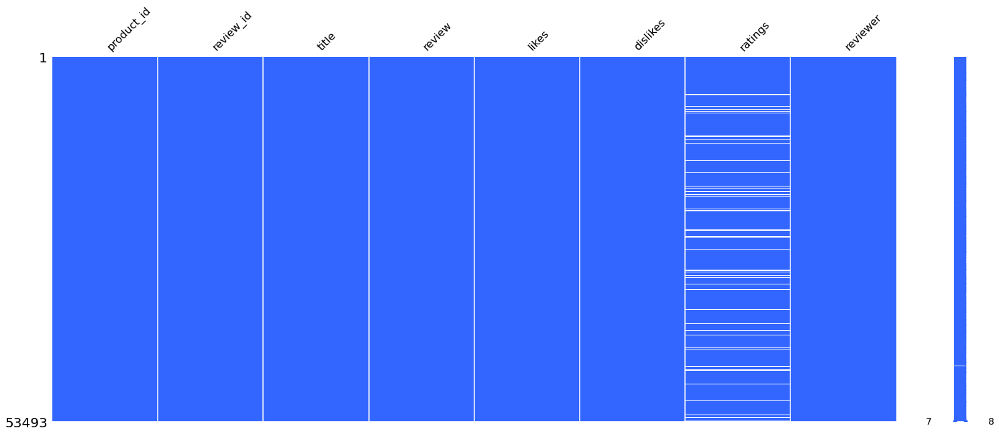

In [47]:
mno.matrix(df, color=[0.2,0.4,1])

## Preprocessing

Now, let's just fill the null values with rating 1 to handle the missing values of the dataset anf of the column ratings.

In [48]:
df['ratings'] = df['ratings'].fillna(1)

## Visualize

Let's just plot the previous graph again and see missing values are still present

<AxesSubplot:>

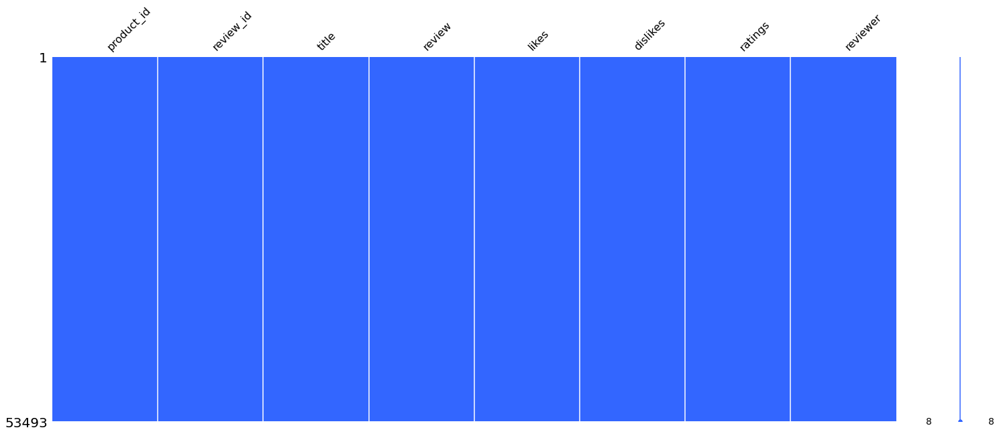

In [49]:
mno.matrix(df, color=[0.2,0.4,1])

## Observation

We can see above that there are no null values in the dataset(in the ratings column)

In [50]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53493 entries, 0 to 289
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   product_id  53493 non-null  object
 1   review_id   53493 non-null  object
 2   title       53493 non-null  object
 3   review      53493 non-null  object
 4   likes       53493 non-null  object
 5   dislikes    53493 non-null  object
 6   ratings     53493 non-null  object
 7   reviewer    53493 non-null  object
dtypes: object(8)
memory usage: 3.7+ MB


## Next Step

Now, we need to find a way to convert this data into numerical form in order to perform Standard Sentiment Ananlysis

# Standard or Binary Sentiment Analysis

An anaysis to just determine that a sentence is a negative one or a positive one.

## Exploration

First let's check that ratings distribution

In [51]:
df['ratings'].value_counts(normalize=True)

5    0.630382
4    0.206195
1    0.093564
3    0.069860
Name: ratings, dtype: float64

<AxesSubplot:>

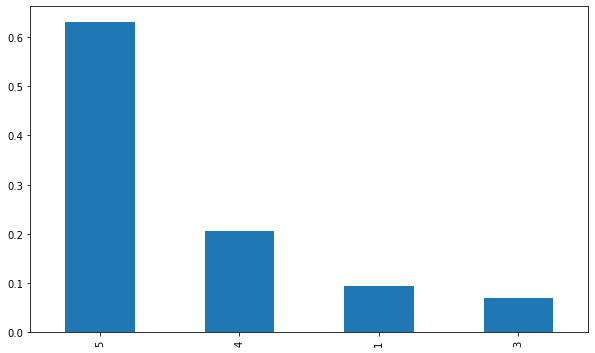

In [52]:
df['ratings'].value_counts(normalize=True).plot(kind = 'bar')

## Observation

We can see that ratings equal to 3 and greater are very high in comparison to ratings below 3, it just means positive reviews are way more higher than negative reviews so this dataset is not balanced, we may have to balance this dataset at a late stage of the notebook

In [53]:
df[df['ratings']=='3'].head(30)

,product_id,review_id,title,review,likes,dislikes,ratings,reviewer
7,ECMB000001,ECMB0000010000008,Does the job,Not bad,90,19,3,Flipkart Customer
13,ECMB000001,ECMB0000010000014,Nice,Good product but camera is not good but not bad,23,6,3,Divakar chaturvedi Chaturvedi
33,ECMB000001,ECMB0000010000034,Good,It's very good in a small amount.,3,1,3,Surendra Sharma
47,ECMB000001,ECMB0000010000048,Does the job,Not good,2,0,3,Flipkart Customer
83,ECMB000001,ECMB0000010000084,Decent product,I am not happy...but good,0,0,3,Suman Laskhar
89,ECMB000001,ECMB0000010000090,Decent product,"Good phone , but lags while opening apps...",0,0,3,Chetansingh Rathore
90,ECMB000001,ECMB0000010000091,Fair,ok.ok product some times its hang,0,0,3,Salman Farisi
91,ECMB000001,ECMB0000010000092,Does the job,"Ram is very poor , it hangs",0,0,3,Pallavi Khalane
97,ECMB000001,ECMB0000010000098,Very Short Length of Charging Cable,Product Redmi 9A is god but what i would suggest is increase the length of Charging cable. Existing length is very short and very difficult for the customer. This thing i wanted to point to the ...,1,0,3,RANJITH TR
102,ECMB000001,ECMB0000010000103,Nice,Value for money,0,0,3,Abdul hafeez Shaikh


## To Think

We can see above that ratings = 3 usually have a kind of mix or neutral reviews, So in this case what should be done as they are neither positive or negative?

I think we can put in positive side for Binary Sentiment Analysis as reviews are in Good sentiment only.

In [54]:
df[df['ratings']=='5']

,product_id,review_id,title,review,likes,dislikes,ratings,reviewer
0,ECMB000001,ECMB0000010000001,Excellent,Wow superb I love it❤️👍 battery backup so nice 👍👍,740,160,5,Abhishek Saini
2,ECMB000001,ECMB0000010000003,Just wow!,Wonderful device and smart phone best camera best bettery and very nice looking nd budget device,125,47,5,Flipkart Customer
3,ECMB000001,ECMB0000010000004,Simply awesome,Very good mobile. Value for money. Battery back up is very good also other functions are smooth. Camera picture good quality. Automatic call recording are available.. Nice mobile..,0,0,5,Amit Sen
4,ECMB000001,ECMB0000010000005,Highly recommended,Really great.... value for money...,90,15,5,Sudeshna pakira
5,ECMB000001,ECMB0000010000006,Terrific purchase,Just simply WOW.....,139,28,5,RABINDRA NATH KAYAL
...,...,...,...,...,...,...,...,...
278,ECMB000082,ECMB0000820000279,Great product,Excellent,0,0,5,MINTU ROMEO
279,ECMB000082,ECMB0000820000280,Brilliant,Good phone,0,0,5,Nitish Kumar
285,ECMB000082,ECMB0000820000286,Excellent,Very nice phone,0,0,5,Flipkart Customer
286,ECMB000082,ECMB0000820000287,Wonderful,Amazing phone with great Performance..,0,0,5,Yusufi Master


## Preprocessing and NLP

To convert reviews in the format so that they can be put into Machine Learning Models for Training.

- Cleaning
- Removing Non required things
- Remvoing Stop words
- Lemmatization
- Etc.

In [55]:
df['review'].head(30)

0                                                                                                                                                           Wow superb I love it❤️👍 battery backup so nice 👍👍
1                                                                                         Mobile So Good In Range Redmi 9a Has Miui 12 Latest Version Nice Phone Display So Good And Battery Was So Very Good
2                                                                                                            Wonderful device and smart phone best camera best bettery and very nice looking nd budget device
3                        Very good mobile. Value for money. Battery back up is very good also other functions are smooth. Camera picture good quality. Automatic call recording are available.. Nice mobile..
4                                                                                                                                                                         Really

In [56]:
df['review'].tail(30)

260                                                                                                                                                                                                      Good😍
261                                                                                                                         India's largest phone companies of Xiaomi and Xiaomi best phone in the india Mi A3
262                                                                                                                                                                                                Very nice 👌
263                                                                                                                                                                 Wrost product don't buy it from flipkart..
264                                                                                                                                                                         

In [57]:
df.tail(30)

,product_id,review_id,title,review,likes,dislikes,ratings,reviewer
260,ECMB000082,ECMB0000820000261,Wonderful,Good😍,0,0,5,Wantesmi Dhar
261,ECMB000082,ECMB0000820000262,Brilliant,India's largest phone companies of Xiaomi and Xiaomi best phone in the india Mi A3,0,0,5,Sameer Khan
262,ECMB000082,ECMB0000820000263,Wonderful,Very nice 👌,0,0,5,Prakash Mahli
263,ECMB000082,ECMB0000820000264,Unsatisfactory,Wrost product don't buy it from flipkart..,0,0,1,Naveen Rawat
264,ECMB000082,ECMB0000820000265,Nice product,Good,0,0,4,P.sateeshbabu
265,ECMB000082,ECMB0000820000266,Simply awesome,Fabulous...,0,0,5,Mohd Sameer
266,ECMB000082,ECMB0000820000267,Terrible product,This is loose Mobile phone because it is not good performance,0,0,1,Nitish Kumar
267,ECMB000082,ECMB0000820000268,Excellent,Best mobile ever i used,0,0,5,Sanjeevi Vamsi
268,ECMB000082,ECMB0000820000269,Excellent,Excellent product best phone !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!,0,0,5,Ganesh Bhende
269,ECMB000082,ECMB0000820000270,Terrific,Good,0,0,5,Dhanesh Kumar


## Cleaning

Now we have to clean Review column as so that we convert them it into numerical forms so that we can feed it to the Machine Learning Model

- Removing Special Characters and Expressions
- Spelling Mistakes
- Contractions
- Removing Emojis
- Removing Stopwords
- Stemming or Lemmatization
- Removing Numerical Values from the review (may be different in case of Aspect Based)
- Tokenization
- Checking Missing Values using missingno matrix
- Wordcloud

### 
Some Cool tricks

- Using Group by to know the imbalance of the Data
- Using FacetGrid to see the data distribution
- Using format DMCB{06d}.format(i)
- Wordcloud

In [58]:
df['review'].iloc[99:201].head(100)

99                                                                                                                                        Camera not good. Processor is too lazy
100                                                                                                                                       It's really good product in this price
101                                                                                                                                                                         Good
102                                                                                                                                                              Value for money
103                                                                                                                                           Best phone under this price range.
104                                                                                                                

##  NLP - All the Steps Possible for Text Cleaning


1. Expanding Abbreviations
2. Removing accounts means words starting with @
3. Removing words starting with hastags(#)
4. Removing URLs
5. Removing special characters and Expressions
6. Removing Stopwords
7. Lemmatization
8. Removing words which are smaller than 3 letter words
9. Handlings emojis
10. Language and Spelling Correction
11. Unicode Normalization
12. Sometimes to tokenize sentences from long paragraphs
13. Finding out the Frequency Distribution of words
14. Word cloud
15. Removing any pattern specific to dataset that should be removed before doing the training
16. May be N-gram Analysis
17. Tokenisation
18. Data Augemenation
19. Removing Numericals

In [59]:
import re

In [60]:
df['review'].iloc[100:101][100]

"It's really good product in this price"

In [61]:
re.sub(r"'s\b",' is', df['review'].iloc[100:101][100])

'It is really good product in this price'

In [62]:
import contractions

In [63]:
contractions.fix(df['review'].iloc[100:101][100])

'It is really good product in this price'

## Exploration

For finding out that if reviews contain URL or website links in them

In [64]:
for i in list(df['review']):
    if 'wow' in i:
        print(i)
        break
 

Its osm andIts camera wow


In [65]:
for i in list(df['review']):
    if '@' in i:
        print(i)
        break
        

Best @ current price . ...no alternative choice available in market....


## Observation

So we found lots of instances where '@' is present, most of the times it is used as 'at'

In [66]:
for i in list(df['review']):
    if 'http' in i:
        print(i)
        break
        

In [67]:
for i in list(df['review']):
    if 'www' in i:
        print(i)
        break
        

Amazing. Im so happy. Clr wawwwww


In [68]:
for i in list(df['review']):
    if '#' in i:
        print(i)
        break
        

Awesome phoneBut i bought it byt axis bank flipkart credit card On no cost emi but they charged interest on it#scam


## Observation

We can see above that there are no url or website links present in the review column, so no need to handle them but we need to remove special characters, numericals and handle emojis as we lots of occurences of those in above reviews

## Notes

I thing for standard sentiment Analysis, there is no harm in removing

- Emojis
- words starting with '@'
- hastags - some of are things and some are feelings, so I am liitle confused about this as half of them should be removed if they are refereing to a product or a company it will come use in Aspect based but not now

##  To do

- Contractions
- Emojis
- Expressiond, Punctuations
- Stop words
- Remove Words smalller than length 3
- Lemmatisation

## Checking how to handle emojis and other non character things

In [69]:
import demoji

In [70]:
for i in list(df['review']):
    if len(demoji.findall(i))!=0:
        print(demoji.findall(i))
        

{'❤️': 'red heart', '👍': 'thumbs up'}
{'👍': 'thumbs up'}
{'📲': 'mobile phone with arrow', '📷': 'camera', '📸': 'camera with flash'}
{'💰': 'money bag'}
{'👍🏻': 'thumbs up: light skin tone', '😊': 'smiling face with smiling eyes'}
{'❤️': 'red heart'}
{'👍': 'thumbs up'}
{'👍': 'thumbs up'}
{'👍': 'thumbs up'}
{'🥰': 'smiling face with hearts'}
{'❤️': 'red heart'}
{'💪': 'flexed biceps', '👍': 'thumbs up'}
{'😍': 'smiling face with heart-eyes', '❤': 'red heart'}
{'👌': 'OK hand'}
{'😘': 'face blowing a kiss'}
{'😇': 'smiling face with halo', '👌': 'OK hand'}
{'🔥': 'fire'}
{'❤️': 'red heart'}
{'😘': 'face blowing a kiss'}
{'👍': 'thumbs up'}
{'👍': 'thumbs up'}
{'🤗': 'hugging face'}
{'👍': 'thumbs up'}
{'👍': 'thumbs up'}
{'👍': 'thumbs up'}
{'👍': 'thumbs up'}
{'😁': 'beaming face with smiling eyes', '😊': 'smiling face with smiling eyes'}
{'👍': 'thumbs up'}
{'💋': 'kiss mark'}
{'😍': 'smiling face with heart-eyes'}
{'💕': 'two hearts', '💖': 'sparkling heart'}
{'💲': 'heavy dollar sign'}
{'😊': 'smiling face with sm

In [71]:
def Contractions_fix(String):
    fix = contractions.fix(String)
    return fix

In [72]:
contractions_fix = df['review'].apply(Contractions_fix)

In [73]:
contractions_fix

0                                                                                                                                                            Wow superb I love it❤️👍 battery backup so nice 👍👍
1                                                                                          Mobile So Good In Range Redmi 9a Has Miui 12 Latest Version Nice Phone Display So Good And Battery Was So Very Good
2                                                                                                             Wonderful device and smart phone best camera best bettery and very nice looking nd budget device
3                         Very good mobile. Value for money. Battery back up is very good also other functions are smooth. Camera picture good quality. Automatic call recording are available.. Nice mobile..
4                                                                                                                                                                          R

In [74]:
def emojis_fix(text):
    emojis = demoji.findall(text)
    for emoji in emojis:
        text = text.replace(emoji," "+emojis[emoji].split(":")[0])
    return text

In [75]:
Emojis_fix = contractions_fix.apply(emojis_fix)

In [76]:
Emojis_fix

0                                                                                                                         Wow superb I love it red heart thumbs up battery backup so nice  thumbs up thumbs up
1                                                                                          Mobile So Good In Range Redmi 9a Has Miui 12 Latest Version Nice Phone Display So Good And Battery Was So Very Good
2                                                                                                             Wonderful device and smart phone best camera best bettery and very nice looking nd budget device
3                         Very good mobile. Value for money. Battery back up is very good also other functions are smooth. Camera picture good quality. Automatic call recording are available.. Nice mobile..
4                                                                                                                                                                          R

In [77]:
# Checking if all the emojis are handled now or not
for i in list(Emojis_fix):
    if len(demoji.findall(i))!=0:
        print(demoji.findall(i))
        print(i)
        

In [78]:
for i in list(df['review']):
    new_text = re.sub(r"[^a-zA-Z]"," ",i)
    print (new_text)
    break

Wow superb I love it    battery backup so nice   


## Notes

We can see above that using regular expression to remove all non alphabet character remove all the other characters other than Alphabet words but we cannot use it directly as somtimes we my need those characters in any other converted Form

In [79]:
import nltk

In [80]:
from nltk.corpus import stopwords

In [81]:
nltk_stopwords = set(stopwords.words('English'))

In [82]:
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
sklearn_stopwords = set(ENGLISH_STOP_WORDS)

In [83]:
combined_stopwords = nltk_stopwords.union(sklearn_stopwords)

In [84]:
len(nltk_stopwords)

179

In [85]:
len(sklearn_stopwords)

318

In [86]:
len(combined_stopwords)

378

## Notes

we have prepared set by combining two sets of stop words, one from nltk and one from sklearn and new combined set is of lenght 378 but still there may have some other stop words specific to this dataset that we may try to handle later

In [87]:
from nltk.stem import WordNetLemmatizer

In [88]:
lemmatizer = WordNetLemmatizer()

## Next

To create a cleaner function which will be fixing the abrevitions using contractions, handling emojis, removing stop words, word length less than 3, Lemmatization 

In [89]:
def text_cleaner(text):
    new_text = contractions.fix(text)
    new_text = emojis_fix(new_text)
    
    return new_text

In [90]:
df['review'].head(40)

0                                                                                                                                                           Wow superb I love it❤️👍 battery backup so nice 👍👍
1                                                                                         Mobile So Good In Range Redmi 9a Has Miui 12 Latest Version Nice Phone Display So Good And Battery Was So Very Good
2                                                                                                            Wonderful device and smart phone best camera best bettery and very nice looking nd budget device
3                        Very good mobile. Value for money. Battery back up is very good also other functions are smooth. Camera picture good quality. Automatic call recording are available.. Nice mobile..
4                                                                                                                                                                         Really

In [91]:
a = list(df['review'])[33]

In [92]:
demo = text_cleaner(a)

In [93]:
demo

'It is very good in a small amount.'

##  Exploration

We were just testing our cleaner function which calls other functions as well and it worked fine, So in next step let's just create the final function

In [94]:
def text_cleaner_final(text):
    new_text = contractions.fix(text)
    new_text = emojis_fix(new_text)
    new_text = re.sub(r"[^a-zA-Z]",' ',new_text)
    new_text = new_text.lower().strip()
    
    new_text = [ token for token in new_text.split() if token not in combined_stopwords]
    
    new_text = [token for token in new_text if len(token) > 2]
    
    cleaned_text = ' '
    for token in new_text:
        cleaned_text = cleaned_text + lemmatizer.lemmatize(token)+ ' '
    
    return cleaned_text

In [95]:
a = list(df['review'])[9]
a

"I bought this for my mom who only uses Youtube, facebook and whatsapp. For her this was quite a large phone. The screen is really good, as per her basic usage the battery lasted for 4 days. The cameras are average for the price. Charging speed is really good. Overall looks nice, Performance for basic tasks is acceptable. For the price it's a really good phone. Speakers are not loud for calls, they are kind of average in terms of volume. Overall satisfied with the purchase."

In [96]:
demo2 = text_cleaner_final(a)

In [97]:
demo2

' bought mom us youtube facebook whatsapp quite large phone screen really good basic usage battery lasted day camera average price charging speed really good overall look nice performance basic task acceptable price really good phone speaker loud call kind average term volume overall satisfied purchase '

In [98]:
cleaned_review = df['review'].apply(text_cleaner_final)

In [99]:
cleaned_review[:10]

0                                                                                                                                           wow superb love red heart thumb battery backup nice thumb thumb 
1                                                                                                                          mobile good range redmi miui latest version nice phone display good battery good 
2                                                                                                                          wonderful device smart phone best camera best bettery nice looking budget device 
3                                                                                good mobile value money battery good function smooth camera picture good quality automatic recording available nice mobile 
4                                                                                                                                                                                  r

In [100]:
df['cleaned_review'] = cleaned_review

In [101]:
df.head(30)

,product_id,review_id,title,review,likes,dislikes,ratings,reviewer,cleaned_review
0,ECMB000001,ECMB0000010000001,Excellent,Wow superb I love it❤️👍 battery backup so nice 👍👍,740,160,5,Abhishek Saini,wow superb love red heart thumb battery backup nice thumb thumb
1,ECMB000001,ECMB0000010000002,Worth the money,Mobile So Good In Range Redmi 9a Has Miui 12 Latest Version Nice Phone Display So Good And Battery Was So Very Good,355,104,4,Dinesh Kumar Sahni,mobile good range redmi miui latest version nice phone display good battery good
2,ECMB000001,ECMB0000010000003,Just wow!,Wonderful device and smart phone best camera best bettery and very nice looking nd budget device,125,47,5,Flipkart Customer,wonderful device smart phone best camera best bettery nice looking budget device
3,ECMB000001,ECMB0000010000004,Simply awesome,Very good mobile. Value for money. Battery back up is very good also other functions are smooth. Camera picture good quality. Automatic call recording are available.. Nice mobile..,0,0,5,Amit Sen,good mobile value money battery good function smooth camera picture good quality automatic recording available nice mobile
4,ECMB000001,ECMB0000010000005,Highly recommended,Really great.... value for money...,90,15,5,Sudeshna pakira,really great value money
5,ECMB000001,ECMB0000010000006,Terrific purchase,Just simply WOW.....,139,28,5,RABINDRA NATH KAYAL,simply wow
6,ECMB000001,ECMB0000010000007,Worth every penny,Is beautiful smart phone,64,11,5,Flipkart Customer,beautiful smart phone
7,ECMB000001,ECMB0000010000008,Does the job,Not bad,90,19,3,Flipkart Customer,bad
8,ECMB000001,ECMB0000010000009,Wonderful,Awesome working,29,5,5,Anup Singh,awesome working
9,ECMB000001,ECMB0000010000010,Must buy!,"I bought this for my mom who only uses Youtube, facebook and whatsapp. For her this was quite a large phone. The screen is really good, as per her basic usage the battery lasted for 4 days. The ca...",12,1,5,Nikhil Yeram,bought mom us youtube facebook whatsapp quite large phone screen really good basic usage battery lasted day camera average price charging speed really good overall look nice performance basic tas...


## Cool Tricks

Extend is a cool function

In [102]:
all_words = []
for text in df['cleaned_review']:
    all_words.extend(text.split())

print(all_words[:50])
    

['wow', 'superb', 'love', 'red', 'heart', 'thumb', 'battery', 'backup', 'nice', 'thumb', 'thumb', 'mobile', 'good', 'range', 'redmi', 'miui', 'latest', 'version', 'nice', 'phone', 'display', 'good', 'battery', 'good', 'wonderful', 'device', 'smart', 'phone', 'best', 'camera', 'best', 'bettery', 'nice', 'looking', 'budget', 'device', 'good', 'mobile', 'value', 'money', 'battery', 'good', 'function', 'smooth', 'camera', 'picture', 'good', 'quality', 'automatic', 'recording']


In [103]:
freq_dist = nltk.FreqDist(all_words)

In [104]:
freq_dist

FreqDist({'good': 26839, 'phone': 18799, 'nice': 11580, 'camera': 11010, 'product': 9293, 'mobile': 8259, 'battery': 6774, 'best': 5826, 'price': 5379, 'quality': 4643, ...})

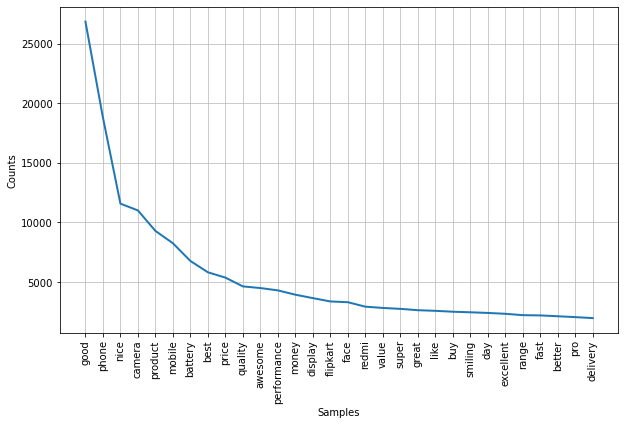

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [105]:
freq_dist.plot(30, cumulative=False)

##  Next Step 

To print wordcloud

In [106]:
a = df['cleaned_review'].str.lower().str.cat(sep = '')

In [107]:
# a

In [108]:
from wordcloud import WordCloud

In [109]:
# wc = WordCloud(background_color='black', max_words=100, max_font_size= 20 )
# wc.generate(a)

## Count Vectorizer

In [110]:
from sklearn.feature_extraction.text import CountVectorizer

In [111]:
cv = CountVectorizer()

In [112]:
cv_features = cv.fit_transform(df['cleaned_review'])

In [113]:
cv_features.shape

(53493, 12168)

In [114]:
cv_features[0]

<1x12168 sparse matrix of type '<class 'numpy.int64'>'
	with 9 stored elements in Compressed Sparse Row format>

In [115]:
cv_features[0].todense()

matrix([[0, 0, 0, ..., 0, 0, 0]])

In [116]:
data_matrix = pd.DataFrame(cv_features.todense())

In [117]:
data_matrix

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

In [118]:
data_matrix.size

650902824

In [119]:
np.count_nonzero(data_matrix)

349344

In [120]:
len(cv.get_feature_names())

12168

## Model Building

In [121]:
from sklearn.model_selection import train_test_split

In [122]:
def label_maker(raw):
    if raw >= 3:
        temp = 1
    else:
        temp = 0
    return temp

In [123]:
df['label'] = df['ratings'].astype(int).apply(label_maker)

In [124]:
X_train, X_test, Y_train, Y_test = train_test_split(cv_features, df['label'], test_size=0.3, stratify=df['label'],
                                                   random_state=42)

In [125]:
Y_train

361    1
235    1
41     1
511    1
45     1
      ..
121    1
263    1
814    1
351    0
294    1
Name: label, Length: 37445, dtype: int64

In [126]:
from sklearn.linear_model import LogisticRegression

In [127]:
LR = LogisticRegression(solver='liblinear')

In [128]:
LR.fit(X_train, Y_train)

LogisticRegression(solver='liblinear')

In [129]:
print(LR.score(X_train, Y_train))
print(LR.score(X_test, Y_test))

0.9615435972760048
0.9537013958125623


In [130]:
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay

In [131]:
Y_pred = LR.predict(X_test)

In [132]:
precision_score(Y_test, Y_pred, pos_label=0)

0.8165137614678899

In [133]:
recall_score(Y_test,Y_pred, pos_label=0)

0.651797603195739

In [134]:
precision_score(Y_test, Y_pred, pos_label=1)

0.9647787729813455

In [135]:
recall_score(Y_test,Y_pred, pos_label=1)

0.9848755671662313

In [136]:
f1_score(Y_test, Y_pred)

0.9747235924476952

In [137]:
f1_score(Y_test, Y_pred, pos_label=0)

0.7249166975194371

In [138]:
confusion_matrix(Y_test, Y_pred)

array([[  979,   523],
       [  220, 14326]])

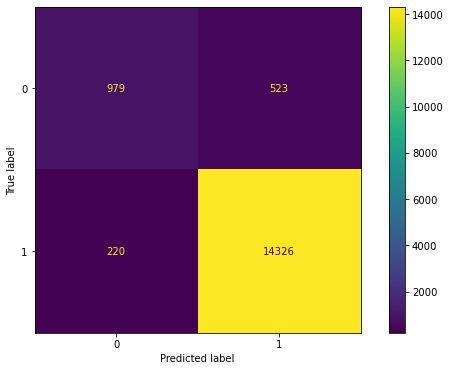

In [139]:
ConfusionMatrixDisplay.from_estimator(LR, X_test, Y_test)

In [140]:
tn, fp, fn, tp = confusion_matrix(Y_test, Y_pred).ravel()

In [141]:
print("tn",tn)
print("fp",fp)
print("tp",tp)
print("fn",fn)

tn 979
fp 523
tp 14326
fn 220


In [142]:
print('Negative_precision',tn/(tn+fn))
print('Negative_recall',tn/(tn+fp))

Negative_precision 0.8165137614678899
Negative_recall 0.651797603195739


## Notes

So for this case we need to improve our specificity or True Negative rate as finding out each negative review is important total accurate negative predictions

## Notes

We can see that negative precision is high but negative recall is low means higher number of negative samples are predicted as positives which is obivously not that good

In [143]:
print('Precision', tp/(tp+fp))
print('Recall', tp/(tp+fn))

Precision 0.9647787729813455
Recall 0.9848755671662313


## Notes

So we can see above precision is lower then Recall so whichever is required for a machine learning model we can choose accordingly

In [144]:
df['label'].value_counts()

1    48488
0     5005
Name: label, dtype: int64

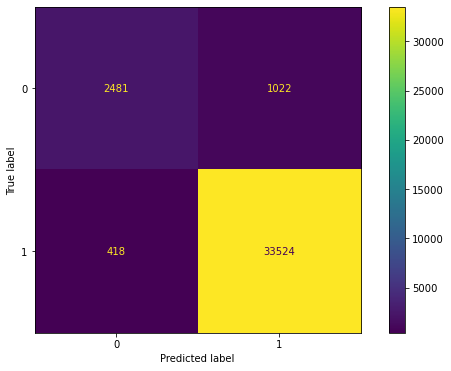

In [145]:
ConfusionMatrixDisplay.from_estimator(LR, X_train, Y_train)

## To Do

To check that the score is real by K-fold cross validation and then finding out the way to create the best Model

In [146]:
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.model_selection import StratifiedKFold

In [147]:
LR = LogisticRegression(solver='liblinear', class_weight='balanced', penalty='l1',C=0.4)
Sfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
results = cross_val_score(LR, cv_features, df['label'], cv=Sfold, scoring='accuracy')
print(results)

[0.90784185 0.90279465 0.90382279 0.90362685 0.90848757]


## Notes

As we can see above after the KFold testing too the scores are coming almost same for all of the splits, so there may be a case of class Imbalance which we may check later

In [148]:
df.head()

,product_id,review_id,title,review,likes,dislikes,ratings,reviewer,cleaned_review,label
0,ECMB000001,ECMB0000010000001,Excellent,Wow superb I love it❤️👍 battery backup so nice 👍👍,740,160,5,Abhishek Saini,wow superb love red heart thumb battery backup nice thumb thumb,1
1,ECMB000001,ECMB0000010000002,Worth the money,Mobile So Good In Range Redmi 9a Has Miui 12 Latest Version Nice Phone Display So Good And Battery Was So Very Good,355,104,4,Dinesh Kumar Sahni,mobile good range redmi miui latest version nice phone display good battery good,1
2,ECMB000001,ECMB0000010000003,Just wow!,Wonderful device and smart phone best camera best bettery and very nice looking nd budget device,125,47,5,Flipkart Customer,wonderful device smart phone best camera best bettery nice looking budget device,1
3,ECMB000001,ECMB0000010000004,Simply awesome,Very good mobile. Value for money. Battery back up is very good also other functions are smooth. Camera picture good quality. Automatic call recording are available.. Nice mobile..,0,0,5,Amit Sen,good mobile value money battery good function smooth camera picture good quality automatic recording available nice mobile,1
4,ECMB000001,ECMB0000010000005,Highly recommended,Really great.... value for money...,90,15,5,Sudeshna pakira,really great value money,1


<AxesSubplot:>

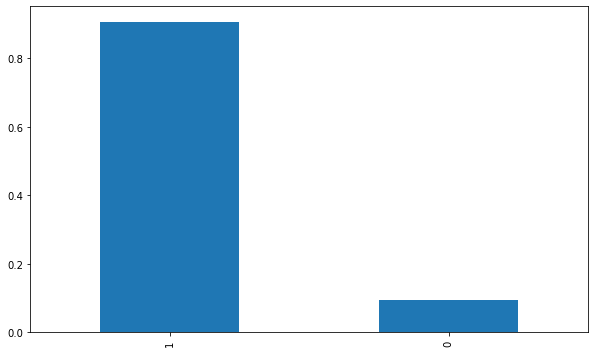

In [149]:
df['label'].value_counts(normalize=True).plot(kind='bar')

## Notes

We can see that data is imbalanced means there is huge difference in the percentage of the negative and positive review, so we cannot use accuracy for them we will have to use another metrics which can give more correct idea of the accuracy of the classification like precision, Recall and F1 which are used often for measuring imbalanced datasets

## Next

Do the class balancing then check with different performance metrics

In [150]:
data_matrix.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

In [151]:
np.count_nonzero(data_matrix.head())

48

In [152]:
cv_features[10].todense()

matrix([[0, 0, 0, ..., 0, 0, 0]])

In [153]:
cv.inverse_transform(cv_features[10])

[array(['battery', 'mobile', 'good', 'redmi', 'camera', 'day', 'lag',
        'normal', 'use', 'processor', 'mark', 'mah', 'last', 'end',
        'biggest', 'disappointment', 'included', 'type', 'cable'],
       dtype='<U30')]

## To Do

How to get the best Result for an Imbalanced Dataset

In [154]:
import xgboost as xgb

In [155]:
model = xgb.XGBClassifier()

In [156]:
model.fit(X_train, Y_train)

[21:18:40] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=8,
              num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [157]:
Y_pred2 = model.predict(X_test)

In [158]:
from sklearn.metrics import accuracy_score

In [159]:
accuracy_score(Y_test, Y_pred2)

0.9538260219341974

In [160]:
# For class label 1
precision_score(Y_test, Y_pred2)

0.9597682008925598

In [161]:
# For Class label 0
precision_score(Y_test, Y_pred2, pos_label=0)

0.8676328502415459

In [162]:
# For label 1
recall_score(Y_test, Y_pred2)

0.9905816031898804

In [163]:
# For Label 0
recall_score(Y_test, Y_pred2, pos_label=0)

0.5978695073235686

## Observation

So we can see that True Negative rate for Logistic Regression is .65 and for Xgboost is .59, so we need to find other ways to improve True Negative Rate.

In [164]:
f1_score(Y_test, Y_pred2, pos_label=0)

0.7079227433977139

In [165]:
data_matrix.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

In [166]:
Y = df['label'].values

In [167]:
data_matrix['label'] = Y

In [168]:
data_matrix.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

In [169]:
data_matrix['label'].value_counts()

1    48488
0     5005
Name: label, dtype: int64

In [170]:
from sklearn.utils import resample

In [171]:
df_majority = data_matrix[data_matrix['label']==1]
df_minority = data_matrix[data_matrix['label']==0]

In [172]:
df_minority.shape

(5005, 12169)

In [173]:
df_majority.shape

(48488, 12169)

In [174]:
df_majority_downsampled = resample(df_majority, replace=True, n_samples=5005, random_state=42)

In [175]:
df_downsampled = pd.concat([df_minority,df_majority_downsampled])

In [176]:
df_downsampled['label'].value_counts()

0    5005
1    5005
Name: label, dtype: int64

In [177]:
df_downsampled.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

In [178]:
Y = df_downsampled['label']

In [179]:
df_downsampled.drop('label',axis=1, inplace = True)

In [180]:
# To find out why kerenel stops and it never does again
# To complete this

In [181]:
X_train, X_test, Y_train, Y_test = train_test_split(df_downsampled, Y, test_size=0.3, stratify=Y,
                                                   random_state=42)

In [182]:
LR = LogisticRegression(solver='liblinear', class_weight='balanced', penalty='l1',C=0.4)

In [183]:
LR.fit(X_train, Y_train)

LogisticRegression(C=0.4, class_weight='balanced', penalty='l1',
                   solver='liblinear')

In [184]:
Y_pred = LR.predict(X_test)

In [185]:
accuracy_score(Y_pred, Y_test)

0.8774558774558775

In [186]:
precision_score(Y_pred, Y_test, pos_label=0)

0.8908122503328895

In [187]:
precision_score(Y_pred, Y_test, pos_label=1)

0.8640906062624917

In [188]:
recall_score(Y_pred, Y_test, pos_label=0)

0.867704280155642

In [189]:
recall_score(Y_pred, Y_test, pos_label=1)

0.8877481177275839

In [190]:
f1_score(Y_pred, Y_test, pos_label=0)

0.8791064388961892

In [191]:
f1_score(Y_pred, Y_test, pos_label=1)

0.87575962187711

## Steps to do Sentiment Analysis

- Data Cleaning - handling Missing Value, Removing Special Characters, Removing Stopwords, Lemmatization
- Creating A data matrix from Review column
- Select a model and perfect it using different techniques like selecting the correct parameters, balancing the dataset, choosing the best model, Getting good required score(accuracy, recall, precision, F1 Score ) over test dataset, rigourous testing.  

# To Learn

- How to choose a model for a problem
- How to make a model perfect to it's limit

In [192]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [193]:
TFID = TfidfVectorizer(stop_words = combined_stopwords, min_df=5, max_features=1000)

In [194]:
df.head()

,product_id,review_id,title,review,likes,dislikes,ratings,reviewer,cleaned_review,label
0,ECMB000001,ECMB0000010000001,Excellent,Wow superb I love it❤️👍 battery backup so nice 👍👍,740,160,5,Abhishek Saini,wow superb love red heart thumb battery backup nice thumb thumb,1
1,ECMB000001,ECMB0000010000002,Worth the money,Mobile So Good In Range Redmi 9a Has Miui 12 Latest Version Nice Phone Display So Good And Battery Was So Very Good,355,104,4,Dinesh Kumar Sahni,mobile good range redmi miui latest version nice phone display good battery good,1
2,ECMB000001,ECMB0000010000003,Just wow!,Wonderful device and smart phone best camera best bettery and very nice looking nd budget device,125,47,5,Flipkart Customer,wonderful device smart phone best camera best bettery nice looking budget device,1
3,ECMB000001,ECMB0000010000004,Simply awesome,Very good mobile. Value for money. Battery back up is very good also other functions are smooth. Camera picture good quality. Automatic call recording are available.. Nice mobile..,0,0,5,Amit Sen,good mobile value money battery good function smooth camera picture good quality automatic recording available nice mobile,1
4,ECMB000001,ECMB0000010000005,Highly recommended,Really great.... value for money...,90,15,5,Sudeshna pakira,really great value money,1


In [220]:
X = df['cleaned_review']

In [221]:
Y = df['label']

In [222]:
X = TFID.fit_transform(X)

In [223]:
X = pd.DataFrame(X.todense())

In [199]:
X.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

In [200]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, stratify=Y,
                                                   random_state=42)

In [248]:
def run_LR(X_train, X_test, Y_train, Y_test):
    LR = LogisticRegression(solver='liblinear', class_weight='balanced', penalty='l1',C=0.4)
    LR.fit(X_train, Y_train)
    Y_pred = LR.predict(X_test)
    print('Accuracy',accuracy_score(Y_pred, Y_test))
    print('Precision, Label 1:',precision_score(Y_pred, Y_test, pos_label=1) )
    print('Precision, Label 0:',precision_score(Y_pred, Y_test, pos_label=0) )
    print('Recall, Label 1:',recall_score(Y_pred, Y_test, pos_label=1))
    print('Recall, Label 0:',recall_score(Y_pred, Y_test, pos_label=0))
    print('F1 Score, Label 1:', f1_score(Y_pred, Y_test, pos_label=1))
    print('F1 Score, Label 0:', f1_score(Y_pred, Y_test, pos_label=0))
    ConfusionMatrixDisplay.from_estimator(LR, X_test, Y_test)
    
    
    

In [202]:
run_LR(X_train, X_test, Y_train, Y_test)

Accuracy 0.8834745762711864
Precision, Label 1: 0.8810669599890004
Precision, Label 0: 0.9067909454061251
Recall, Label 1: 0.9891941957394258
Recall, Label 0: 0.44049159120310477
F1 Score, Label 1: 0.9320049450949022
F1 Score, Label 0: 0.5929473225946887


## Observation 

We can see that Recall and F1 score for label 0 is very less which is due to imbalanced dataset so in next step we
will balance he dataset and do it again

- When Balancing the dataset by reducing the majority group was giving the good results but don't know, I think it can skip learning various other variations of data which may later decrease the score

In [207]:
X

0    1    2    3    4    5    6    7    8    9    10   11   12   13   \
0      0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
1      0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
2      0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
3      0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
4      0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
...    ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
53488  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
53489  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
53490  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
53491  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
53492  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   

       14        15   16   17   18   19   20   21   22   23   24   25   26   \
0      0.0  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
1      0.0  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
2      0.0  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
3      0.0  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
4      0.0  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
...    ...       ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
53488  0.0  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
53489  0.0  0.598764  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
53490  0.0  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
53491  0.0  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
53492  0.0  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   

       27   28   29   30   31   32   33   34   35   36   37   38        39   \
0      0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000   
1      0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000   
2      0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000   
3      0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000   
4      0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000   
...    ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...       ...   
53488  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000   
53489  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000   
53490  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.818395   
53491  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000   
53492  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000   

            40   41   42   43   44   45   46        47   48   49   50   51   \
0      0.000000  0.0  0.0  0.0  0.0  0.0  0.0  0.224217  0.0  0.0  0.0  0.0   
1      0.000000  0.0  0.0  0.0  0.0  0.0  0.0  0.000000  0.0  0.0  0.0  0.0   
2      0.000000  0.0  0.0  0.0  0.0  0.0  0.0  0.000000  0.0  0.0  0.0  0.0   
3      0.318842  0.0  0.0  0.0  0.0  0.0  0.0  0.000000  0.0  0.0  0.0  0.0   
4      0.000000  0.0  0.0  0.0  0.0  0.0  0.0  0.000000  0.0  0.0  0.0  0.0   
...         ...  ...  ...  ...  ...  ...  ...       ...  ...  ...  ...  ...   
53488  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  0.000000  0.0  0.0  0.0  0.0   
53489  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  0.000000  0.0  0.0  0.0  0.0   
53490  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  0.000000  0.0  0.0  0.0  0.0   
53491  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  0.000000  0.0  0.0  0.0  0.0   
53492  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  0.182948  0.0  0.0  0.0  0.0   

       52   53   54        55   56   57   58   59   60   61   62   63   64   \
0      0.0  0.0  0.0  0.161139  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
1      0.0  0.0  0.0  0.201322  0.0  0.0  0.0  0.0  0

In [224]:
X['label'] = df['label'].values

In [212]:
X.shape[0]

53493

In [214]:
def Resampled(data_matrix, Direction):
    df_majority = data_matrix[data_matrix['label']==1]
    df_minority = data_matrix[data_matrix['label']==0]
    if Direction=='U' or Direction=='u':
        count = df_majority.shape[0]
        df_minority = resample(df_minority, replace=True, n_samples=count, random_state=42)
    else:
        count = df_minority.shape[0]
        df_majority = resample(df_majority, replace=True, n_samples=count,random_state=42)
        
    data_matrix = pd.concat([df_majority, df_minority])
    return data_matrix
        
        

In [215]:
X = Resampled(X,'d')

In [216]:
X['label'].value_counts()

1    5005
0    5005
Name: label, dtype: int64

In [217]:
# Let's check the score after undersampling the TFID data
Y = X['label']
X.drop('label', axis=1, inplace=True)

In [218]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, stratify=Y,
                                                   random_state=42)

In [219]:
run_LR(X_train, X_test, Y_train, Y_test)

Accuracy 0.8628038628038628
Precision, Label 1: 0.82145236508994
Precision, Label 0: 0.9041278295605859
Recall, Label 1: 0.8954248366013072
Recall, Label 0: 0.8351783517835178
F1 Score, Label 1: 0.8568450312717164
F1 Score, Label 0: 0.8682864450127877


## Observation 

We can see that after undersampling it all the scores for each class has increased and had become in same range we will also check it once after oversampling the data and overall in scores "Count Vectorizer" has over the "TFID Vectorizer" on undersampled Data

In [225]:
X = Resampled(X,'U')

In [226]:
X['label'].value_counts()

1    48488
0    48488
Name: label, dtype: int64

In [227]:
Y = X['label']
X.drop('label', axis=1, inplace=True)

In [228]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, stratify=Y,
                                                   random_state=42)

Accuracy 0.8975354896366824
Precision, Label 1: 0.8821669187405472
Precision, Label 0: 0.912903004055819
Recall, Label 1: 0.9101354706007518
Recall, Label 0: 0.885687608376684
F1 Score, Label 1: 0.8959329725955665
F1 Score, Label 0: 0.8990894011712535


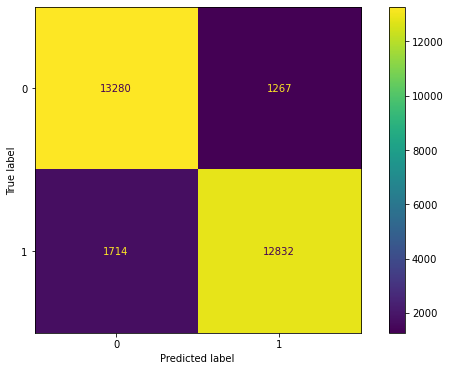

In [249]:
run_LR(X_train, X_test, Y_train, Y_test)

Accuracy 0.9016543169865798
Precision, Label 1: 0.8880443108832715
Precision, Label 0: 0.9152647240800212
Recall, Label 1: 0.9128959961233267
Recall, Label 0: 0.8910081743869209
F1 Score, Label 1: 0.9002986857825569
F1 Score, Label 0: 0.9029735778856496


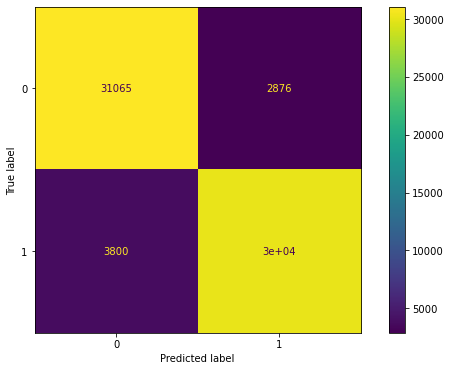

In [250]:
run_LR(X_train, X_train, Y_train, Y_train)

## Observation

So we can see above for both the train data and test dataset overall score has increased for both the labels on upsampled TFID Data and it seems a stable one.

Next, we will try to run it after doing the word embedding process.

We will also look at the different Machine Learning Models to find out which model will perform the best

In [236]:
feature_names = np.array(TFID.get_feature_names)

In [245]:
feature_names.size

1000

In [233]:
import mglearn

In [237]:
LR.fit(X_train, Y_train)

LogisticRegression(C=0.4, class_weight='balanced', penalty='l1',
                   solver='liblinear')

In [238]:
coeff = LR.coef_

In [244]:
coeff.size

1000

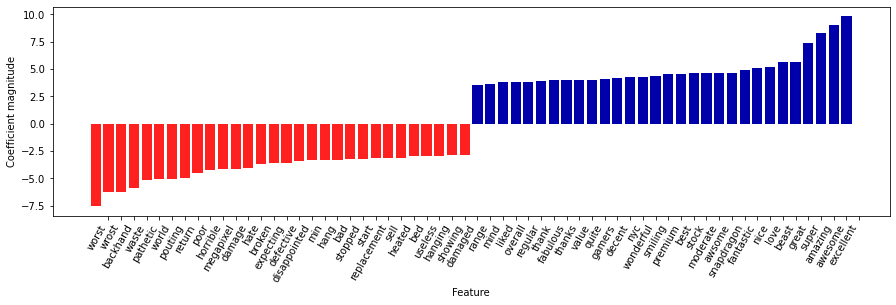

In [253]:
mglearn.tools.visualize_coefficients(coeff, feature_names, n_top_features=30)

### Observation

In the above image we can cleary see the words which makes a review negative and also those words which makes reviews positive.

- To find out that countvectorizer should be used or not in Sentiment Analysis
- To find out a way to test the model perfectly

In [252]:
# To find out a way to check that the above model trained will be performing well for different circumstances or not
# To do the testing well

LR1 = LogisticRegression(class_weight ='balanced', solver='liblinear', penalty ='l1', C=0.4)
kfold = StratifiedKFold(n_splits=5, shuffle = True, random_state = 42)
results = cross_val_score(LR1, X_test, Y_test, cv=kfold, scoring='recall')
print(results)
print(np.round((results.mean())*100,2),np.round((results.std())*100,2))
 

[0.87010309 0.86524579 0.86833964 0.87143348 0.872121  ]
86.94 0.25


### Notes

In above i think cross_val_score with Startified K Fold is not a good way to check the model performance as training data and testing data comes from the same set even though they are from different Fold each time but they are from same set, so we need to find n another way to make sure that the model created is perfect.


- I can split the dataset into three parts Train, Validation and Test where validation can be used for tuning Hyper Parameters and checking

- Second, I can use K Fold for Validation

In [255]:
# To check N gram models later whenever it will be needed

In [261]:
# Now to train a model after doing the word Embedding
from gensim.models import Word2Vec

In [258]:
Review_list = list(df['cleaned_review'].apply(lambda x:x.split()))

In [260]:
Review_list[2]

['wonderful',
 'device',
 'smart',
 'phone',
 'best',
 'camera',
 'best',
 'bettery',
 'nice',
 'looking',
 'budget',
 'device']

In [394]:
cbow_model = Word2Vec(Review_list, vector_size=300, window=3, min_count=1, sg=1 )

In [395]:
print(cbow_model)

Word2Vec(vocab=12169, vector_size=300, alpha=0.025)


In [396]:
cbow_model.wv.index_to_key[:20]

['good',
 'phone',
 'nice',
 'camera',
 'product',
 'mobile',
 'battery',
 'best',
 'price',
 'quality',
 'awesome',
 'performance',
 'money',
 'display',
 'flipkart',
 'face',
 'redmi',
 'value',
 'super',
 'great']

In [397]:
len(cbow_model.wv.index_to_key)

12169

In [398]:
def document_vector(doc):
    w1=[]
    doc1 = [word for word in doc.split() if word in cbow_model.wv.index_to_key]
    
    for word in doc1:
        w1.append(cbow_model.wv.get_vector(word))
    
    w1_ = np.array(w1)
    w1_mean = w1_.mean(axis=0)
    return w1_mean

In [399]:
Review_temp = df['cleaned_review'].apply(document_vector)

In [400]:
Review_temp[:5]

0    [0.25850815, 0.22019824, -0.26951402, -0.10831086, 0.06282468, -0.27146447, 0.23788859, 0.30757812, -0.20911425, -0.13990064, -0.017258381, -0.10301609, 0.12820266, -0.028077088, 0.16371995, 0.168...
1    [0.046476565, 0.13341966, -0.07304524, -0.035638962, 0.016751278, -0.3499838, 0.2271217, 0.46507904, 0.035811003, -0.13497812, 0.104867905, -0.04188349, 0.019405868, 0.09217979, -0.025158493, -0.0...
2    [0.036945045, 0.1546294, -0.11436161, -0.040785447, -0.029963627, -0.265011, 0.2056814, 0.42722312, 0.009530761, -0.17892964, 0.055746835, -0.011979039, -0.0041985046, 0.03345796, 0.00064105977, -...
3    [0.05886678, 0.16621532, -0.1105081, 0.023297446, 0.034217507, -0.2945498, 0.20205422, 0.4182844, 0.0657406, -0.09698978, 0.05581188, -0.09477321, 0.03702848, 0.11835156, -0.055729397, 0.035565622...
4    [0.13669467, 0.22728682, -0.17843385, -0.080250986, -0.016714927, -0.15099435, 0.32866168, 0.4659896, -0.065657504, -0.14810926, 0.074566156, -0.042447407, 0.008459274, -0.055

In [401]:
Review_temp.loc[1]

1    [0.046476565, 0.13341966, -0.07304524, -0.035638962, 0.016751278, -0.3499838, 0.2271217, 0.46507904, 0.035811003, -0.13497812, 0.104867905, -0.04188349, 0.019405868, 0.09217979, -0.025158493, -0.0...
1    [0.046476565, 0.13341966, -0.07304524, -0.035638962, 0.016751278, -0.3499838, 0.2271217, 0.46507904, 0.035811003, -0.13497812, 0.104867905, -0.04188349, 0.019405868, 0.09217979, -0.025158493, -0.0...
1    [0.046476565, 0.13341966, -0.07304524, -0.035638962, 0.016751278, -0.3499838, 0.2271217, 0.46507904, 0.035811003, -0.13497812, 0.104867905, -0.04188349, 0.019405868, 0.09217979, -0.025158493, -0.0...
1    [0.085175164, 0.21260016, -0.10724828, -0.07513423, -0.017829789, -0.29303953, 0.163506, 0.43244103, 0.022346903, -0.19544882, 0.0443257, -0.042603076, 0.04486124, 0.01867396, 0.015301502, -0.0054...
1    [0.085175164, 0.21260016, -0.10724828, -0.07513423, -0.017829789, -0.29303953, 0.163506, 0.43244103, 0.022346903, -0.19544882, 0.0443257, -0.042603076, 0.04486124, 0.01867396,

In [402]:
X = pd.DataFrame(Review_temp.values)

In [403]:
X.shape

(53493, 1)

In [404]:
X.head()

,0
0,"[0.25850815, 0.22019824, -0.26951402, -0.10831086, 0.06282468, -0.27146447, 0.23788859, 0.30757812, -0.20911425, -0.13990064, -0.017258381, -0.10301609, 0.12820266, -0.028077088, 0.16371995, 0.168..."
1,"[0.046476565, 0.13341966, -0.07304524, -0.035638962, 0.016751278, -0.3499838, 0.2271217, 0.46507904, 0.035811003, -0.13497812, 0.104867905, -0.04188349, 0.019405868, 0.09217979, -0.025158493, -0.0..."
2,"[0.036945045, 0.1546294, -0.11436161, -0.040785447, -0.029963627, -0.265011, 0.2056814, 0.42722312, 0.009530761, -0.17892964, 0.055746835, -0.011979039, -0.0041985046, 0.03345796, 0.00064105977, -..."
3,"[0.05886678, 0.16621532, -0.1105081, 0.023297446, 0.034217507, -0.2945498, 0.20205422, 0.4182844, 0.0657406, -0.09698978, 0.05581188, -0.09477321, 0.03702848, 0.11835156, -0.055729397, 0.035565622..."
4,"[0.13669467, 0.22728682, -0.17843385, -0.080250986, -0.016714927, -0.15099435, 0.32866168, 0.4659896, -0.065657504, -0.14810926, 0.074566156, -0.042447407, 0.008459274, -0.055431515, 0.011927244, ..."


In [405]:
X.isnull().sum()

0    677
dtype: int64

In [406]:
Review_temp.shape

(53493,)

In [407]:
embedding_size = 300
review_vec = np.ones((len(X),embedding_size))*np.nan

In [408]:
review_vec.shape

(53493, 300)

In [409]:
for i in range(review_vec.shape[0]):
    review_vec[i,:]= X[0][i]

In [410]:
review_vec

array([[ 0.25850815,  0.22019824, -0.26951402, ...,  0.01606706,
         0.38015988,  0.01321323],
       [ 0.04647657,  0.13341966, -0.07304524, ..., -0.05203542,
         0.17847313, -0.05075881],
       [ 0.03694504,  0.15462939, -0.11436161, ..., -0.0404576 ,
         0.21355771, -0.01546677],
       ...,
       [ 0.0512442 ,  0.10678967, -0.05045506, ..., -0.10647776,
         0.16852111, -0.0606069 ],
       [ 0.05736385,  0.22122657, -0.08527055, ..., -0.07659199,
         0.10661045,  0.05945969],
       [ 0.00804861,  0.08959498, -0.0692694 , ..., -0.06401078,
         0.13230905, -0.06146635]])

In [411]:
X = pd.DataFrame(review_vec)

In [412]:
X.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299
0,0.258508,0.220198,-0.269514,-0.108311,0.062825,-0.271464,0.237889,0.307578,-0.209114,-0.139901,-0.017258,-0.103016,0.128203,-0.028077,0.163720,0.168715,0.202515,0.047503,-0.023015,-0.271529,-0.281827,0.163966,0.187878,-0.039239,-0.090909,-0.075919,-0.471247,0.095665,-0.196295,-0.419593,0.054921,0.345208,0.089586,-0.192030,0.023817,0.556420,0.131369,-0.137006,-0.199357,0.169790,0.074338,0.242435,0.047947,-0.146798,0.247510,0.187100,-0.038110,0.110651,-0.030037,0.044313,-0.008784,-0.020096,0.006783,-0.100592,0.236708,0.208908,-0.143165,0.292971,-0.093733,0.222272,0.164911,0.057754,0.176240,0.325716,-0.092353,0.147183,0.019412,0.003158,-0.092050,0.284468,-0.075068,0.034055,-0.005032,-0.068484,-0.027338,0.168904,-0.171222,-0.224221,0.028743,0.216355,-0.078571,-0.254998,0.179935,0.313411,-0.101236,0.026182,0.178006,0.369183,0.184013,0.163126,0.141199,0.299408,0.435541,0.160091,0.038996,0.025485,0.285532,-0.241366,-0.203057,-0.012130,-0.002159,-0.049560,0.055806,-0.111663,-0.135605,-0.202428,0.367229,0.006624,-0.372770,0.024825,-0.094224,-0.324253,0.152078,0.032190,-0.280435,-0.069389,-0.013239,-0.222121,0.199874,-0.282787,-0.107455,0.082781,0.039192,0.106941,-0.147737,0.024611,0.184278,-0.333707,-0.140625,-0.018461,0.442797,0.119881,-0.014696,-0.353937,-0.060481,0.146404,-0.329322,-0.273981,-0.283721,-0.060006,0.149972,-0.049631,-0.435384,0.100331,0.170517,0.150310,-0.027684,0.033861,0.194316,-0.023752,0.092974,-0.243810,0.136206,0.100429,-0.129510,0.040267,-0.202809,0.013959,-0.131231,0.110357,-0.104487,0.148967,-0.352793,0.054394,0.101760,0.258615,0.117666,-0.121507,-0.147060,0.514754,-0.052652,-0.027980,-0.155941,0.263178,-0.129367,0.075976,-0.151044,-0.218529,0.151959,0.216217,-0.215612,0.169079,-0.417075,-0.027881,-0.233791,-0.080587,0.296179,0.313670,-0.046557,-0.096854,-0.066689,0.100210,-0.402302,-0.058823,-0.134294,-0.150674,0.272838,-0.299863,0.242578,0.153238,-0.155654,-0.020917,-0.179507,-0.089719,0.376107,-0.030922,-0.051085,0.106542,-0.159339,0.253160,-0.040932,-0.201325,0.090019,-0.318498,0.136530,-0.213233,0.176116,-0.205542,-0.219883,0.079877,0.019158,0.072881,-0.186653,-0.195022,-0.149386,-0.145524,0.238643,-0.292843,-0.208979,-0.053492,0.109148,-0.142600,0.078466,0.135272,-0.185948,0.279367,0.001807,-0.155010,-0.211349,-0.260856,0.072399,-0.150540,-0.023407,0.226091,0.042018,-0.152470,0.053139,-0.194155,0.172873,-0.055347,0.116213,-0.092042,-0.003113,0.118977,-0.310157,0.012798,0.057512,-0.115110,-0.392042,-0.111280,-0.031512,0.110238,0.300372,-0.286806,-0.156367,0.123236,0.171189,0.089745,-0.420576,0.069271,-0.260631,0.193063,0.172559,-0.148733,0.036777,-0.002121,0.294002,0.085396,-0.248889,0.144302,-0.046245,-0.057424,-0.059076,0.172256,-0.201837,0.082833,-0.304280,0.019101,0.119265,0.132858,0.014154,0.627437,0.055474,0.013885,0.562852,0.134235,-0.064697,0.016067,0.380160,0.013213
1,0.046477,0.133420,-0.073045,-0.035639,0.016751,-0.349984,

In [413]:
X.shape

(53493, 300)

In [414]:
Y = df['label']

In [415]:
Y.shape

(53493,)

In [416]:
Y.isnull().sum()

0

In [417]:
X['label'] = Y.values

In [418]:
X.isnull().sum()

0        677
1        677
2        677
3        677
4        677
        ... 
296      677
297      677
298      677
299      677
label      0
Length: 301, dtype: int64

In [419]:
X.dropna(how='any',inplace=True)

In [420]:
X.isnull().sum()

0        0
1        0
2        0
3        0
4        0
        ..
296      0
297      0
298      0
299      0
label    0
Length: 301, dtype: int64

## TO Check

How word 2 vec gives null rows

In [421]:
X.shape

(52816, 301)

In [422]:
Y = X['label']

In [334]:
X = X.drop('label',axis=1)

In [335]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, stratify=Y,
                                                   random_state=42)

Accuracy 0.8846251266464032
Precision, Label 1: 0.8868003633568584
Precision, Label 0: 0.8636056718433491
Recall, Label 1: 0.9843325835724812
Recall, Label 0: 0.44118661607450843
F1 Score, Label 1: 0.9330245552124689
F1 Score, Label 0: 0.5840182648401826


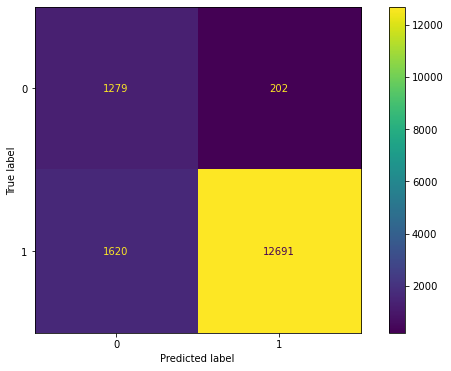

In [336]:
run_LR(X_train, X_test, Y_train, Y_test)

In [423]:
X = Resampled(X,'U')

In [424]:
Y = X['label']
X = X.drop('label',axis=1)

In [425]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, stratify=Y,
                                                   random_state=42)

Accuracy 0.8751266552531358
Precision, Label 1: 0.8842767295597485
Precision, Label 0: 0.8659772203200335
Recall, Label 1: 0.8683777106780126
Recall, Label 0: 0.8821268417680974
F1 Score, Label 1: 0.8762551069870508
F1 Score, Label 0: 0.8739774330042314


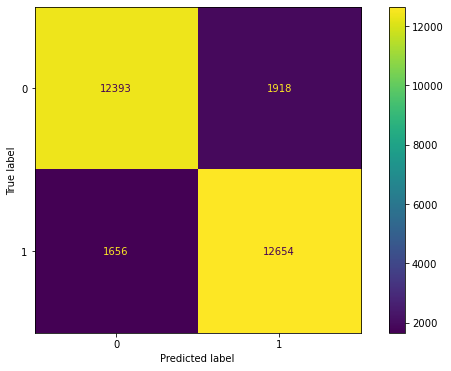

In [368]:
run_LR(X_train, X_test, Y_train, Y_test)

In [370]:

LR1 = LogisticRegression(class_weight ='balanced', solver='liblinear', penalty ='l1', C=0.4)
kfold = StratifiedKFold(n_splits=5, shuffle = True, random_state = 42)
results = cross_val_score(LR1, X_train, Y_train, cv=kfold, scoring='recall')
print(results)
print(np.round((results.mean())*100,2),np.round((results.std())*100,2))

[0.89594251 0.89472896 0.89637616 0.885295   0.89487871]
89.34 0.41


In [372]:
# I have not mastered the word embedding, let look into more details tomorrow
# Check any project which used word embedding for NLP
# https://builtin.com/machine-learning/nlp-word2vec-python - Yes we can do the mean or word vector to find 
# the overall vector of a sentence - Remember one thing always balanced out the data and check for everything not
# just accuracy but recall, precison, f1-score, Auc-roc curve etc. too

In [385]:
# let Get on with neural networks
# Do the Prediction with Neural networks then learn different Macine learning Algorithms with it's Mathematics
# To Get Expert in Machine Learning Models and Neural Networks and when to use which then do all kind 
# of different projects including all the other Sentiment Analysis, Time Series, Image Recogntion, Different 
# Types of Problems, do any 10 different detailed projects.

In [387]:
from keras.models import Sequential

In [388]:
from keras.layers import Dense, Dropout


In [432]:
from keras.callbacks import ModelCheckpoint

In [389]:
import pydot
import keras.backend as k

In [430]:
def define_model(n_words):
    model = Sequential()
    model.add(Dense(60, input_shape=(n_words,), activation='relu', kernel_regularizer='l2'))
    model.add(Dense(30, activation='relu', kernel_regularizer='l2'))
    model.add(Dense(1,activation='sigmoid'))
    
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'],)
    
    model.summary()
    
    return model

In [392]:
def evaluate_model(X_train, X_test, Y_train, Y_test):
    n_repeat = 5
    scores = list()
    n_words = X_train.shape[1]
    
    for i in range(n_repeat):
        model = define_model(n_words)
        
        model.fit(X_train, Y_train, epochs=1, verbose=0)
        
        _, acc_rec = model.evaluate(X_test, Y_test, verbose = 0)
        
        scores.append(acc_rec)
    
    return scores

In [426]:
X_train.shape

(67013, 300)

In [427]:
X_test.shape

(28721, 300)

In [431]:
k.clear_session()
n_words = X_train.shape[1]
model = define_model(n_words)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 60)                18060     
_________________________________________________________________
dense_2 (Dense)              (None, 30)                1830      
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 31        
Total params: 19,921
Trainable params: 19,921
Non-trainable params: 0
_________________________________________________________________


In [433]:
check_point = ModelCheckpoint("BestModel.h5",
                             monitor="val_loss",
                             mode = "min",
                             save_best_only = True,
                             verbose = 1)
callbacks =[check_point]
h = model.fit(X_train, Y_train, validation_split=0.1, callbacks = callbacks, batch_size=180, epochs=20, verbose = 2)

Train on 60311 samples, validate on 6702 samples
Epoch 1/20
 - 3s - loss: 0.6982 - accuracy: 0.8497 - val_loss: 0.4309 - val_accuracy: 0.8644

Epoch 00001: val_loss improved from inf to 0.43091, saving model to BestModel.h5
Epoch 2/20
 - 2s - loss: 0.4150 - accuracy: 0.8634 - val_loss: 0.4031 - val_accuracy: 0.8654

Epoch 00002: val_loss improved from 0.43091 to 0.40306, saving model to BestModel.h5
Epoch 3/20
 - 2s - loss: 0.3979 - accuracy: 0.8655 - val_loss: 0.3907 - val_accuracy: 0.8697

Epoch 00003: val_loss improved from 0.40306 to 0.39067, saving model to BestModel.h5
Epoch 4/20
 - 2s - loss: 0.3882 - accuracy: 0.8674 - val_loss: 0.3837 - val_accuracy: 0.8693

Epoch 00004: val_loss improved from 0.39067 to 0.38367, saving model to BestModel.h5
Epoch 5/20
 - 2s - loss: 0.3823 - accuracy: 0.8673 - val_loss: 0.3791 - val_accuracy: 0.8738

Epoch 00005: val_loss improved from 0.38367 to 0.37914, saving model to BestModel.h5
Epoch 6/20
 - 2s - loss: 0.3774 - accuracy: 0.8683 - val_los

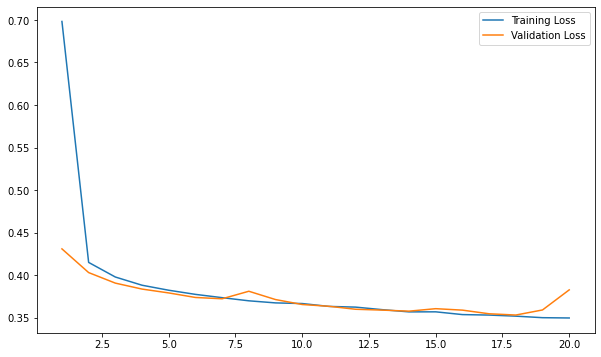

In [434]:
plt.plot(list(range(1,21)), h.history['loss'], label ='Training Loss' )
plt.plot(list(range(1,21)), h.history['val_loss'],  label='Validation Loss')  
plt.legend()

Text(0, 0.5, 'Accuracy')

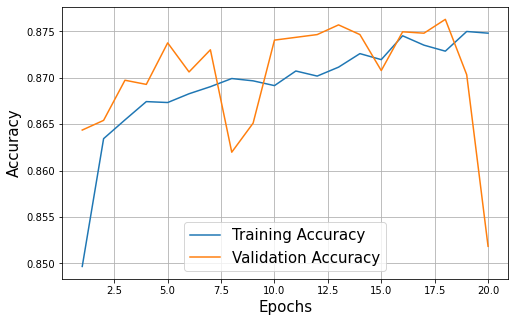

In [435]:
plt.figure(figsize=(8,5))
plt.plot(list(range(1,21)), h.history['accuracy'], label='Training Accuracy')
plt.plot(list(range(1,21)), h.history['val_accuracy'], label='Validation Accuracy')
plt.legend(fontsize=15)
plt.grid()
plt.xlabel('Epochs', fontsize=15)
plt.ylabel('Accuracy', fontsize=15)

In [436]:
loss, acc = model.evaluate(X_test, Y_test, verbose=0)
print(" loss %f, acc %f" % (loss,(acc)*100))

 loss 0.372094, acc 85.839629


In [437]:
res = evaluate_model(X_train, X_test, Y_train, Y_test)

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 60)                18060     
_________________________________________________________________
dense_5 (Dense)              (None, 30)                1830      
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 31        
Total params: 19,921
Trainable params: 19,921
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_7 (Dense)              (None, 60)                18060     
_________________________________________________________________
dense_8 (Dense)              (None, 30)                1830      
____________________________

In [438]:
res

[0.8730197548866272,
 0.8672052025794983,
 0.8700602054595947,
 0.8620173335075378,
 0.8646286725997925]

In [441]:
model.predict(X_test)

array([[0.03646946],
       [0.96133983],
       [0.8414223 ],
       ...,
       [0.8414223 ],
       [0.40742218],
       [0.8414223 ]], dtype=float32)

In [442]:
# Create an another neural network again